In [1]:
import pandas as pd
import time

In [2]:
start=time.perf_counter()

In [3]:
from DatabaseCreator import DatabaseCreator
import CJDH_local_settings

#Run Database Creator
if __name__ == "__main__":
    db_creator = DatabaseCreator(db_settings=CJDH_local_settings.local_settings['FPL_Points_Predictor'])
    fpl_engine = db_creator.get_engine_for("fpl_data_analysis")

In [4]:
from FPLPredictor import FPLPredictor

In [5]:
#add this info to a settings dict?
stats_current_gameweek = 9
picks_current_gameweek = 11
current_season = 20252026

In [6]:
# Load df from sql
df = db_creator.run_sql("""SELECT *
                        FROM playergw_transformed
                          """)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 146422 entries, 0 to 146421
Columns: 293 entries, player_name_id to saves_elo_adj_per90_running_avg_prev_10
dtypes: float64(288), object(5)
memory usage: 327.3+ MB


In [7]:
df[(df['season']==20252026)
   &(df['team_name']=='Arsenal')
#    &(df['event']==9)
   &(df['player_name_id']=='Bukayo Saka')
   ][['player_name_id','event','total_points','opp_team_name']].sort_values(by='event')

,player_name_id,event,total_points,opp_team_name
131850,Bukayo Saka,1.0,3.0,Man Utd
131851,Bukayo Saka,2.0,6.0,Leeds
131852,Bukayo Saka,3.0,0.0,Liverpool
131853,Bukayo Saka,4.0,0.0,Nott'm Forest
131809,Bukayo Saka,5.0,1.0,Man City
131812,Bukayo Saka,6.0,2.0,Newcastle
131815,Bukayo Saka,7.0,NaN,West Ham
131854,Bukayo Saka,8.0,7.0,Fulham
131855,Bukayo Saka,9.0,3.0,Crystal Palace
131857,Bukayo Saka,10.0,NaN,Burnley


In [8]:
cbi_defcon_cols = ['cbi_alltime_avg',
 'cbi_per90_alltime_avg',
 'cbi_running_avg_prev_3',
 'cbi_per90_running_avg_prev_3',
 'cbi_elo_adj_running_avg_prev_3',
 'cbi_elo_adj_per90_running_avg_prev_3',
 'cbi_running_avg_prev_5',
 'cbi_per90_running_avg_prev_5',
 'cbi_elo_adj_running_avg_prev_5',
 'cbi_elo_adj_per90_running_avg_prev_5',
 'cbi_running_avg_prev_10',
 'cbi_per90_running_avg_prev_10',
 'cbi_elo_adj_running_avg_prev_10',
 'cbi_elo_adj_per90_running_avg_prev_10',
 'defensive_contribution_alltime_avg',
 'defensive_contribution_per90_alltime_avg',
 'defensive_contribution_running_avg_prev_3',
 'defensive_contribution_per90_running_avg_prev_3',
 'defensive_contribution_elo_adj_running_avg_prev_3',
 'defensive_contribution_elo_adj_per90_running_avg_prev_3',
 'defensive_contribution_running_avg_prev_5',
 'defensive_contribution_per90_running_avg_prev_5',
 'defensive_contribution_elo_adj_running_avg_prev_5',
 'defensive_contribution_elo_adj_per90_running_avg_prev_5',
 'defensive_contribution_running_avg_prev_10',
 'defensive_contribution_per90_running_avg_prev_10',
 'defensive_contribution_elo_adj_running_avg_prev_10',
 'defensive_contribution_elo_adj_per90_running_avg_prev_10',
 'saves_alltime_avg',
 'saves_per90_alltime_avg',
 'saves_running_avg_prev_3',
 'saves_per90_running_avg_prev_3',
 'saves_elo_adj_running_avg_prev_3',
 'saves_elo_adj_per90_running_avg_prev_3',
 'saves_running_avg_prev_5',
 'saves_per90_running_avg_prev_5',
 'saves_elo_adj_running_avg_prev_5',
 'saves_elo_adj_per90_running_avg_prev_5',
 'saves_running_avg_prev_10',
 'saves_per90_running_avg_prev_10',
 'saves_elo_adj_running_avg_prev_10',
 'saves_elo_adj_per90_running_avg_prev_10',
 'recoveries_alltime_avg',
 'recoveries_per90_alltime_avg',
 'recoveries_running_avg_prev_3',
 'recoveries_per90_running_avg_prev_3',
 'recoveries_elo_adj_running_avg_prev_3',
 'recoveries_elo_adj_per90_running_avg_prev_3',
 'recoveries_running_avg_prev_5',
 'recoveries_per90_running_avg_prev_5',
 'recoveries_elo_adj_running_avg_prev_5',
 'recoveries_elo_adj_per90_running_avg_prev_5',
 'recoveries_running_avg_prev_10',
 'recoveries_per90_running_avg_prev_10',
 'recoveries_elo_adj_running_avg_prev_10',
 'recoveries_elo_adj_per90_running_avg_prev_10',
 'tackles_alltime_avg',
 'tackles_per90_alltime_avg',
 'tackles_running_avg_prev_3',
 'tackles_per90_running_avg_prev_3',
 'tackles_elo_adj_running_avg_prev_3',
 'tackles_elo_adj_per90_running_avg_prev_3',
 'tackles_running_avg_prev_5',
 'tackles_per90_running_avg_prev_5',
 'tackles_elo_adj_running_avg_prev_5',
 'tackles_elo_adj_per90_running_avg_prev_5',
 'tackles_running_avg_prev_10',
 'tackles_per90_running_avg_prev_10',
 'tackles_elo_adj_running_avg_prev_10',
 'tackles_elo_adj_per90_running_avg_prev_10']

In [9]:
# #restricts to player_name_id who have >0 minutes in that season
# #model struggles to predict higher values, so maybe cut-off points at 10, or try log(points) as a depvar
# for each indepvar: filter outliers & standardize

Cleaned df size: 7207/13788

Training Set Performance:
R² Score: 0.8060
RMSE: 16.1482
MAE: 11.7156

Test Set Performance:
R² Score: 0.5202
RMSE: 25.5436
MAE: 18.0186

Feature Importance:
                                                     feature  importance
                                  minutes_running_avg_prev_3    0.567633
                          minutes_elo_adj_running_avg_prev_3    0.062400
                    goals_scored_elo_adj_running_avg_prev_10    0.007198
                            opp_team_elo_running_avg_prev_10    0.006984
                                                opp_team_elo    0.006913
                                     bps_running_avg_prev_10    0.006852
                                                    elo_diff    0.006599
              opp_team_elo_elo_adj_per90_running_avg_prev_10    0.006573
                             opp_team_elo_running_avg_prev_3    0.006497
                                 minutes_running_avg_prev_10    0.006093
          

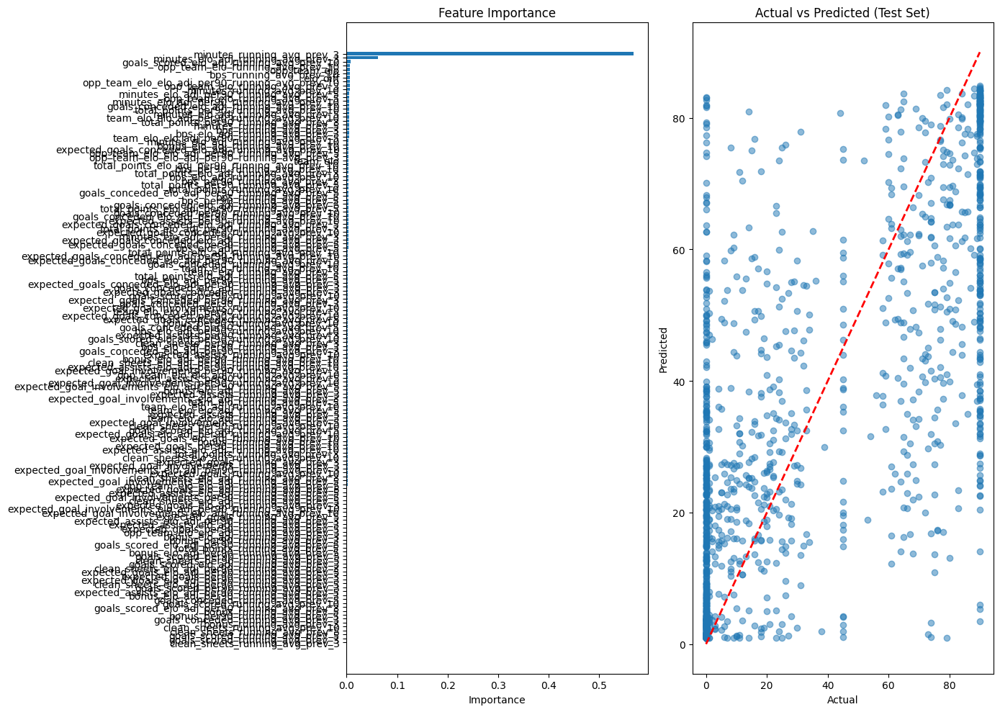

Cleaned df size: 27819/49707

Training Set Performance:
R² Score: 0.6863
RMSE: 21.5080
MAE: 15.7574

Test Set Performance:
R² Score: 0.5229
RMSE: 26.4579
MAE: 19.1894

Feature Importance:
                                                     feature  importance
                                  minutes_running_avg_prev_3    0.741914
                          minutes_elo_adj_running_avg_prev_3    0.013978
                                 minutes_running_avg_prev_10    0.007196
                                     bps_running_avg_prev_10    0.007026
                                  minutes_running_avg_prev_5    0.005656
                          minutes_elo_adj_running_avg_prev_5    0.005595
                                                    elo_diff    0.004499
                            opp_team_elo_running_avg_prev_10    0.004312
                                                opp_team_elo    0.004122
                             opp_team_elo_running_avg_prev_3    0.003935
         

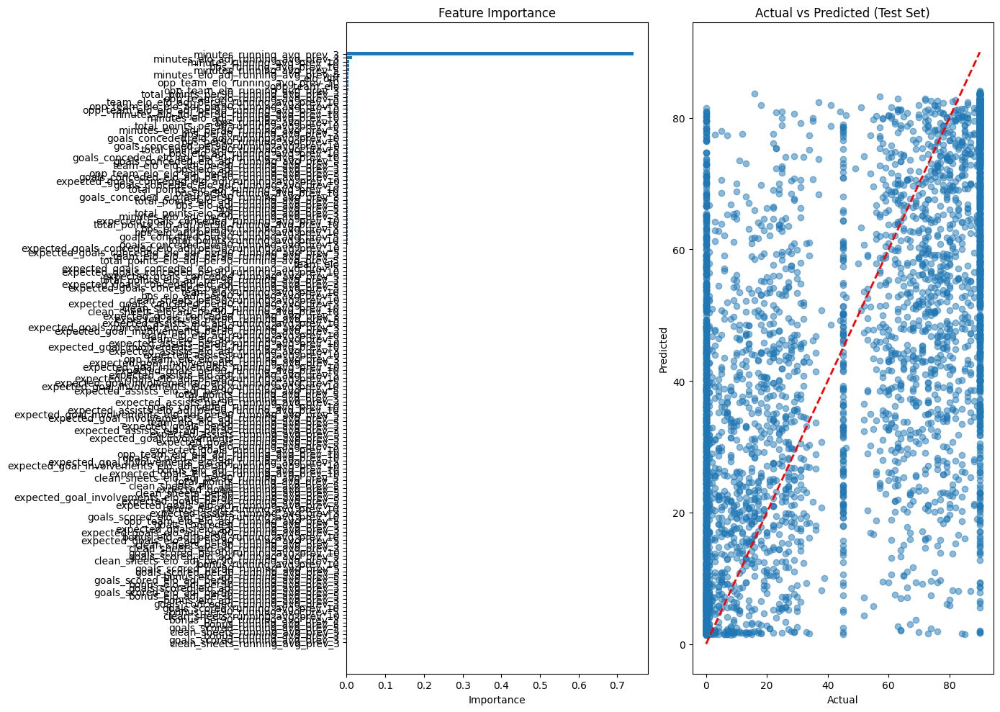

Cleaned df size: 21072/38883

Training Set Performance:
R² Score: 0.6492
RMSE: 25.0049
MAE: 18.5153

Test Set Performance:
R² Score: 0.4958
RMSE: 29.9508
MAE: 22.1850

Feature Importance:
                                                     feature  importance
                                  minutes_running_avg_prev_3    0.695303
                          minutes_elo_adj_running_avg_prev_3    0.018425
                                 minutes_running_avg_prev_10    0.008408
                                                opp_team_elo    0.007333
                            opp_team_elo_running_avg_prev_10    0.006868
                             opp_team_elo_running_avg_prev_3    0.006420
                                                    elo_diff    0.006042
                             opp_team_elo_running_avg_prev_5    0.005307
                                     bps_running_avg_prev_10    0.004663
              opp_team_elo_elo_adj_per90_running_avg_prev_10    0.004098
         

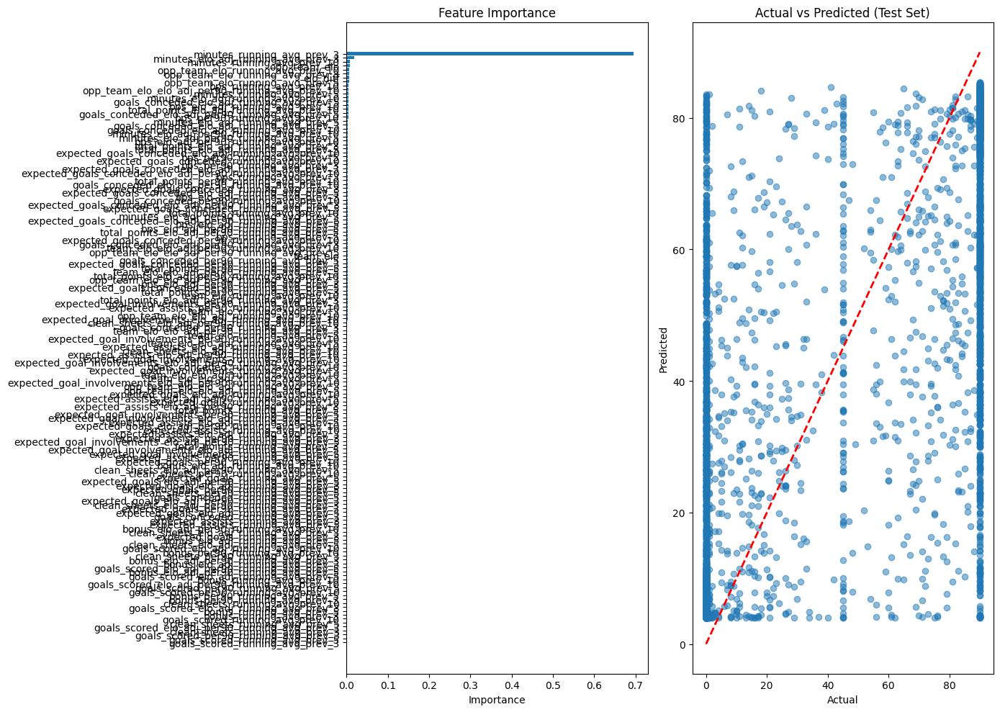

Cleaned df size: 4524/8249

Training Set Performance:
R² Score: 0.8323
RMSE: 18.3164
MAE: 10.4108

Test Set Performance:
R² Score: 0.7232
RMSE: 23.5327
MAE: 14.1152

Feature Importance:
                                                     feature  importance
                                  minutes_running_avg_prev_3    0.282345
                             total_points_running_avg_prev_3    0.216375
                       total_points_per90_running_avg_prev_3    0.129420
                     total_points_elo_adj_running_avg_prev_3    0.072634
                          minutes_elo_adj_running_avg_prev_3    0.019490
                            opp_team_elo_running_avg_prev_10    0.010290
               total_points_elo_adj_per90_running_avg_prev_3    0.010240
                                bps_per90_running_avg_prev_3    0.009202
                                                opp_team_elo    0.009070
                             opp_team_elo_running_avg_prev_3    0.008085
           

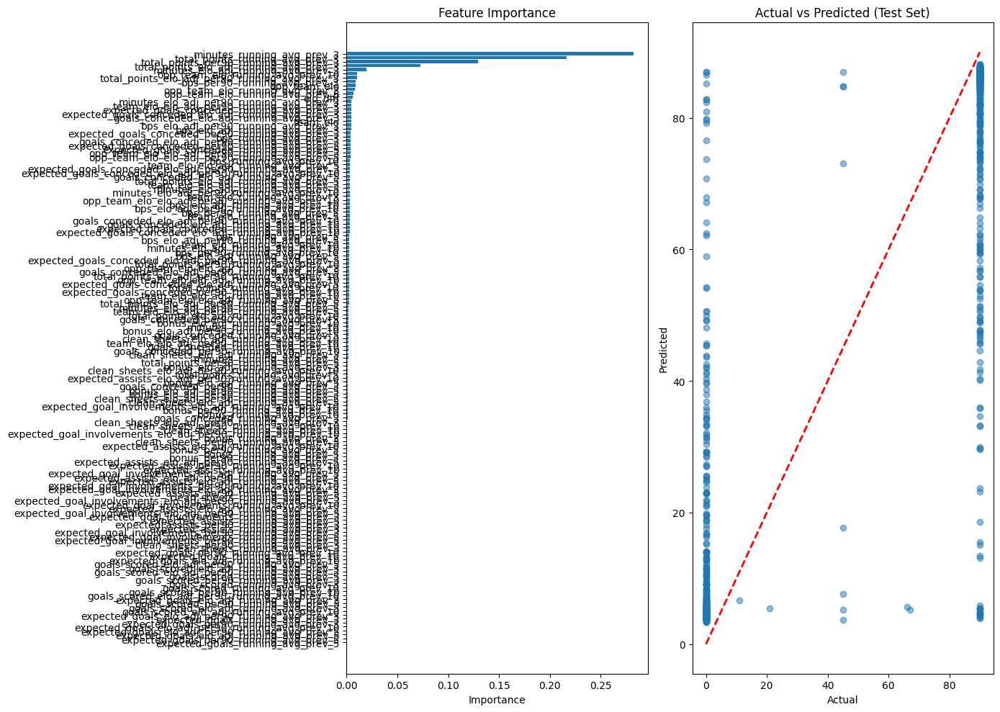

In [10]:
filtered = (df['player_season_minutes_total']>0)#&(df['total_points']<15)#&(df['minutes']>45)

if __name__ == "__main__":
    
    FWD_mins_predictor = FPLPredictor(
        data=df[filtered],
        target='minutes',
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols
        )
    FWD_mins_predictor.fit()
    FWD_mins_predictor.plot_results()

    MID_mins_predictor = FPLPredictor(
        data=df[filtered],
        target='minutes',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_mins_predictor.fit()
    MID_mins_predictor.plot_results()

    DEF_mins_predictor = FPLPredictor(
        data=df[filtered],
        target='minutes',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_mins_predictor.fit()
    DEF_mins_predictor.plot_results()

    GK_mins_predictor = FPLPredictor(
        data=df[filtered],
        target='minutes',
        positions={'GK'},
        columns_to_drop = cbi_defcon_cols)
    GK_mins_predictor.fit()
    GK_mins_predictor.plot_results()

target=expected_goals_per90, FWD_xG_predictor
Cleaned df size: 2287/4002

Training Set Performance:
R² Score: 0.6593
RMSE: 0.2623
MAE: 0.2004

Test Set Performance:
R² Score: 0.0926
RMSE: 0.4431
MAE: 0.3203

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.045412
                                                opp_team_elo    0.033211
expected_goal_involvements_elo_adj_per90_running_avg_prev_10    0.032756
        expected_goal_involvements_per90_running_avg_prev_10    0.024963
          expected_assists_elo_adj_per90_running_avg_prev_10    0.020510
      expected_goal_involvements_elo_adj_running_avg_prev_10    0.018360
              goals_scored_elo_adj_per90_running_avg_prev_10    0.015391
            expected_goals_elo_adj_per90_running_avg_prev_10    0.014395
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.013507
                            opp_team_elo_r

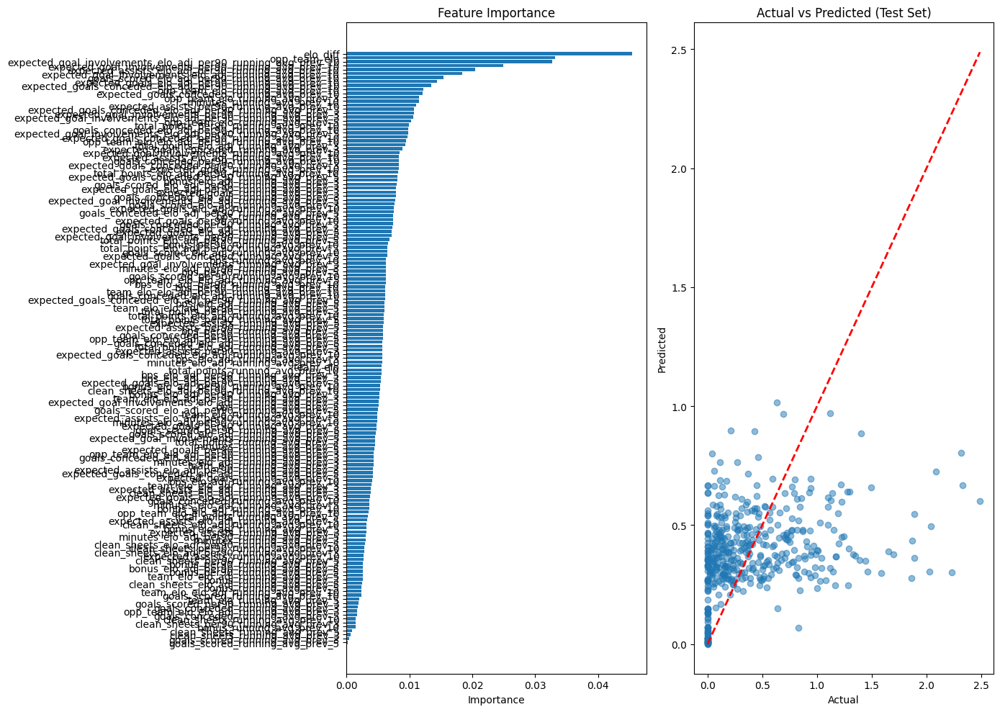

target=expected_goals_per90, MID_xG_predictor
Cleaned df size: 10219/16507

Training Set Performance:
R² Score: 0.5467
RMSE: 0.1731
MAE: 0.1138

Test Set Performance:
R² Score: 0.1207
RMSE: 0.2351
MAE: 0.1447

Feature Importance:
                                                     feature  importance
                          expected_goals_running_avg_prev_10    0.146044
                    expected_goals_per90_running_avg_prev_10    0.054526
                                                opp_team_elo    0.041813
                  expected_goals_elo_adj_running_avg_prev_10    0.030287
                                                    elo_diff    0.023295
                             opp_team_elo_running_avg_prev_5    0.021518
            expected_goals_elo_adj_per90_running_avg_prev_10    0.019152
              expected_goal_involvements_running_avg_prev_10    0.013691
        expected_goal_involvements_per90_running_avg_prev_10    0.012534
                                      bp

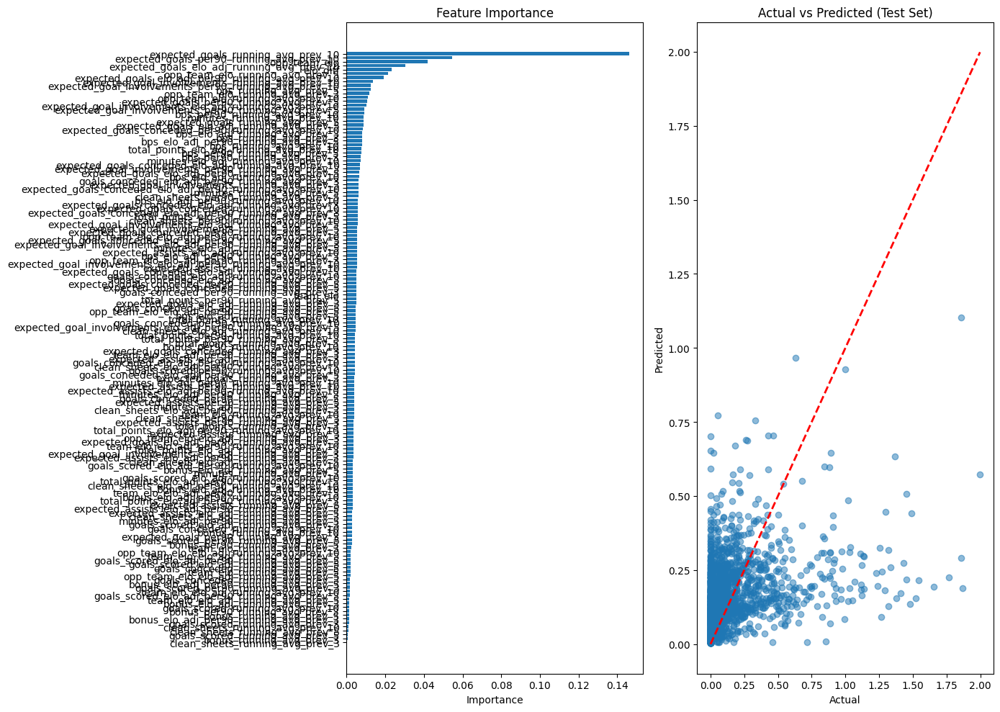

target=expected_goals_per90, DEF_xG_predictor
Cleaned df size: 8825/14613

Training Set Performance:
R² Score: 0.3500
RMSE: 0.0938
MAE: 0.0540

Test Set Performance:
R² Score: -0.0131
RMSE: 0.1151
MAE: 0.0628

Feature Importance:
                                                     feature  importance
                                                opp_team_elo    0.039110
                  expected_goals_elo_adj_running_avg_prev_10    0.038245
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.028156
            expected_goals_elo_adj_per90_running_avg_prev_10    0.028079
                        bps_elo_adj_per90_running_avg_prev_5    0.026647
              total_points_elo_adj_per90_running_avg_prev_10    0.021544
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.020022
                             opp_team_elo_running_avg_prev_5    0.018149
                 expected_goals_conceded_running_avg_prev_10    0.017814
                  expected_goals_concede

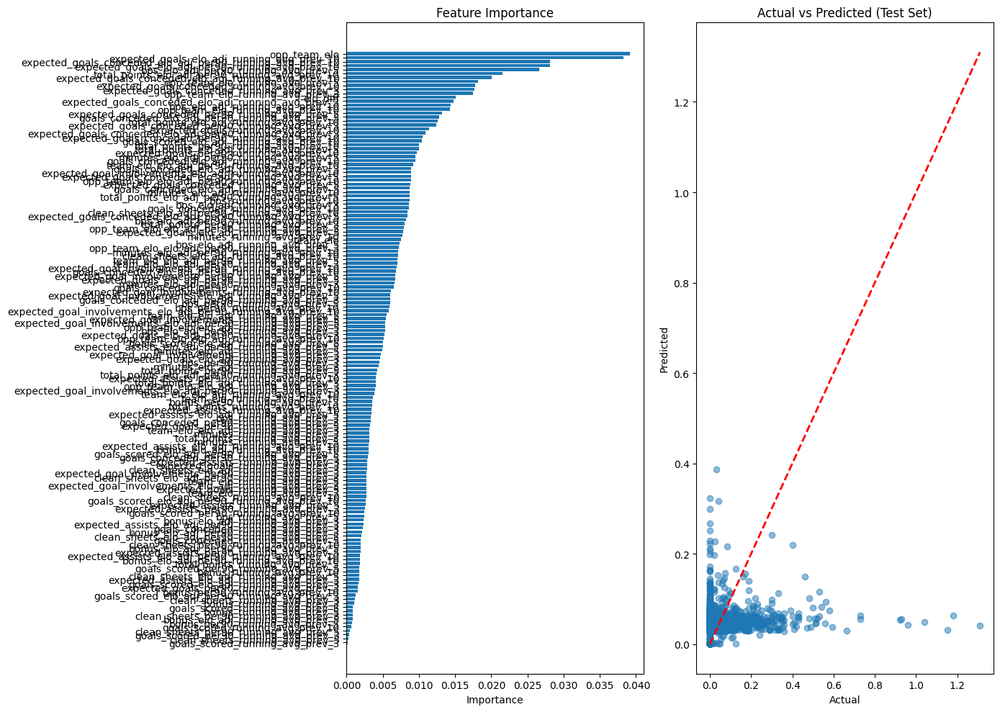

In [11]:
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>500)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=expected_goals_per90, FWD_xG_predictor")
    FWD_xG_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_per90',
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols)
    FWD_xG_predictor.fit()
    FWD_xG_predictor.plot_results()

    print("target=expected_goals_per90, MID_xG_predictor")
    MID_xG_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_per90',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_xG_predictor.fit()
    MID_xG_predictor.plot_results()
    
    print("target=expected_goals_per90, DEF_xG_predictor")
    DEF_xG_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_per90',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_xG_predictor.fit()
    DEF_xG_predictor.plot_results()

target=expected_assists_per90, FWD_xA_predictor
Cleaned df size: 2287/4002

Training Set Performance:
R² Score: 0.6072
RMSE: 0.0802
MAE: 0.0527

Test Set Performance:
R² Score: -0.0573
RMSE: 0.1240
MAE: 0.0798

Feature Importance:
                                                     feature  importance
                expected_assists_elo_adj_running_avg_prev_10    0.058421
                 expected_assists_elo_adj_running_avg_prev_3    0.041096
                                                opp_team_elo    0.039285
                        bps_elo_adj_per90_running_avg_prev_5    0.027554
                             opp_team_elo_running_avg_prev_3    0.024730
                        expected_assists_running_avg_prev_10    0.023589
                                                    elo_diff    0.021584
          expected_assists_elo_adj_per90_running_avg_prev_10    0.017648
           expected_assists_elo_adj_per90_running_avg_prev_5    0.017489
                  expected_assists_per9

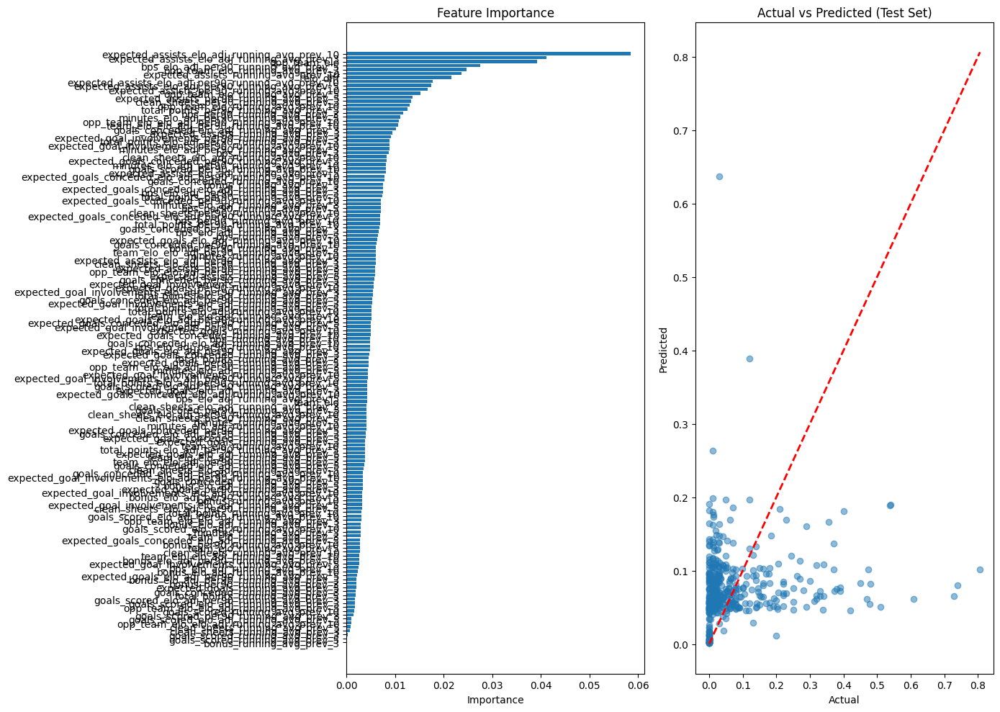

target=expected_assists_per90, MID_xA_predictor
Cleaned df size: 10219/16507

Training Set Performance:
R² Score: 0.4772
RMSE: 0.1197
MAE: 0.0813

Test Set Performance:
R² Score: 0.1812
RMSE: 0.1416
MAE: 0.0930

Feature Importance:
                                                     feature  importance
                expected_assists_elo_adj_running_avg_prev_10    0.097899
          expected_assists_elo_adj_per90_running_avg_prev_10    0.081661
                                                    elo_diff    0.034869
      expected_goal_involvements_elo_adj_running_avg_prev_10    0.034286
                                                opp_team_elo    0.032852
                        expected_assists_running_avg_prev_10    0.029257
                  expected_assists_per90_running_avg_prev_10    0.024937
                   expected_assists_per90_running_avg_prev_5    0.018276
           expected_assists_elo_adj_per90_running_avg_prev_5    0.014467
                                 minut

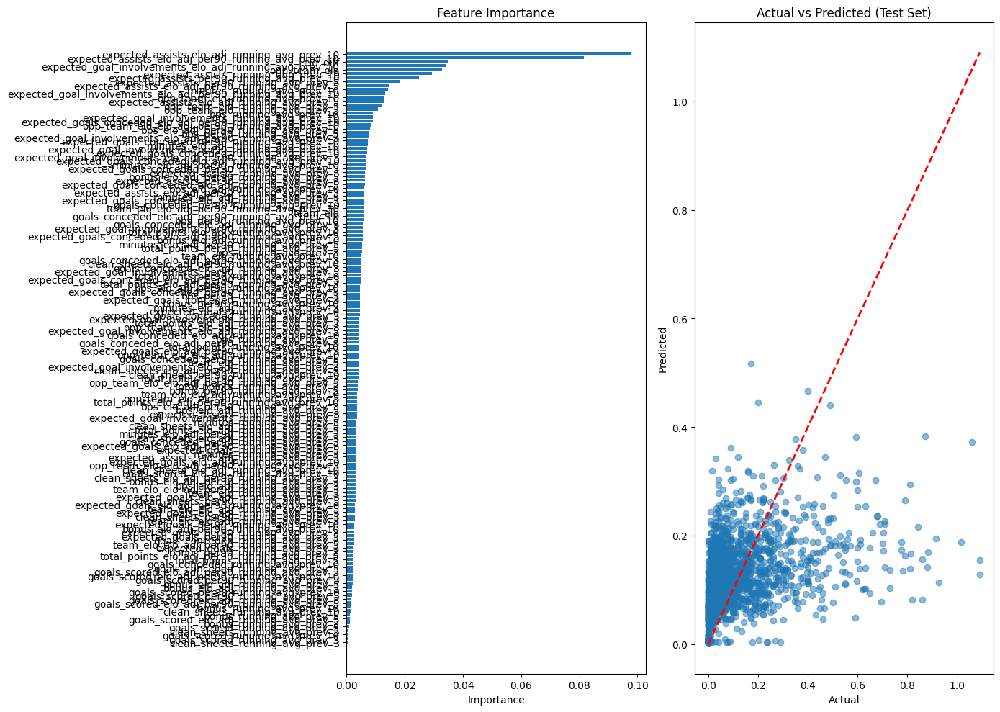

target=expected_assists_per90, DEF_xA_predictor
Cleaned df size: 8825/14613

Training Set Performance:
R² Score: 0.5156
RMSE: 0.0716
MAE: 0.0422

Test Set Performance:
R² Score: 0.0676
RMSE: 0.1023
MAE: 0.0547

Feature Importance:
                                                     feature  importance
          expected_assists_elo_adj_per90_running_avg_prev_10    0.094320
                        expected_assists_running_avg_prev_10    0.061411
                expected_assists_elo_adj_running_avg_prev_10    0.059115
                  expected_assists_per90_running_avg_prev_10    0.051728
                                                opp_team_elo    0.045772
                             opp_team_elo_running_avg_prev_3    0.021846
                                                    elo_diff    0.018447
           expected_assists_elo_adj_per90_running_avg_prev_5    0.014264
                            opp_team_elo_running_avg_prev_10    0.013554
                                       

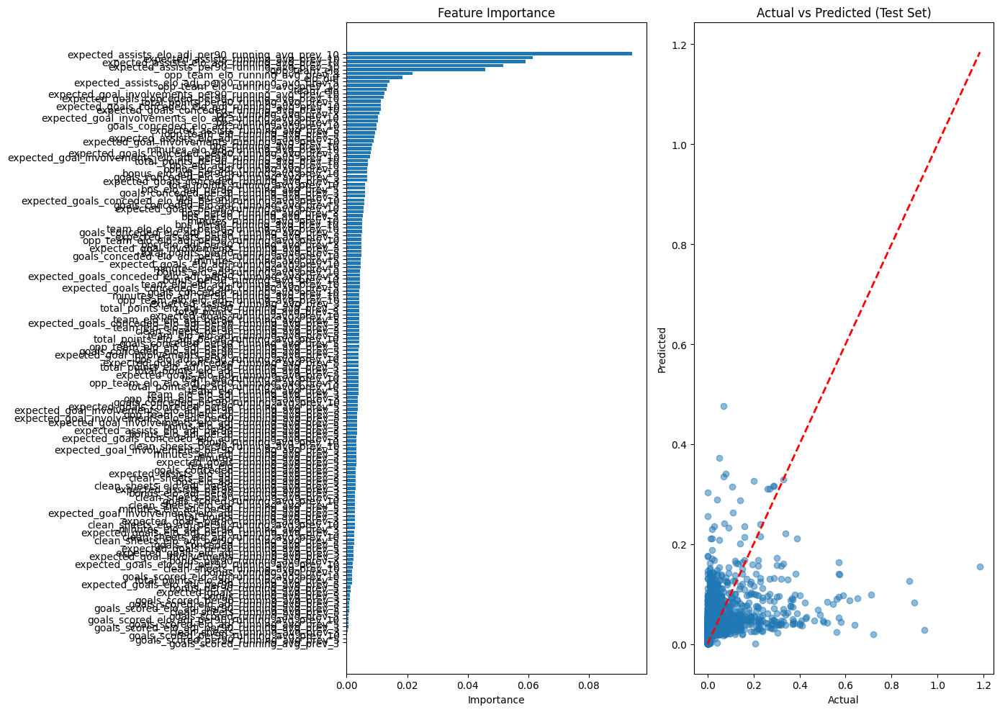

In [12]:
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>500)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=expected_assists_per90, FWD_xA_predictor")
    FWD_xA_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_assists_per90',
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols)
    FWD_xA_predictor.fit()
    FWD_xA_predictor.plot_results()

    print("target=expected_assists_per90, MID_xA_predictor")
    MID_xA_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_assists_per90',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_xA_predictor.fit()
    MID_xA_predictor.plot_results()
    
    print("target=expected_assists_per90, DEF_xA_predictor")
    DEF_xA_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_assists_per90',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_xA_predictor.fit()
    DEF_xA_predictor.plot_results()

target=expected_goals_conceded_per90, FWD_xGC_predictor
Cleaned df size: 2287/4002

Training Set Performance:
R² Score: 0.7605
RMSE: 0.4656
MAE: 0.3640

Test Set Performance:
R² Score: 0.2608
RMSE: 0.7979
MAE: 0.5890

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.165474
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.129399
           expected_goals_conceded_per90_running_avg_prev_10    0.086566
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.033965
                 expected_goals_conceded_running_avg_prev_10    0.022768
          expected_goals_conceded_elo_adj_running_avg_prev_5    0.020926
                                                opp_team_elo    0.020313
                            opp_team_elo_running_avg_prev_10    0.018415
                             opp_team_elo_running_avg_prev_5    0.012038
                  expected_goals

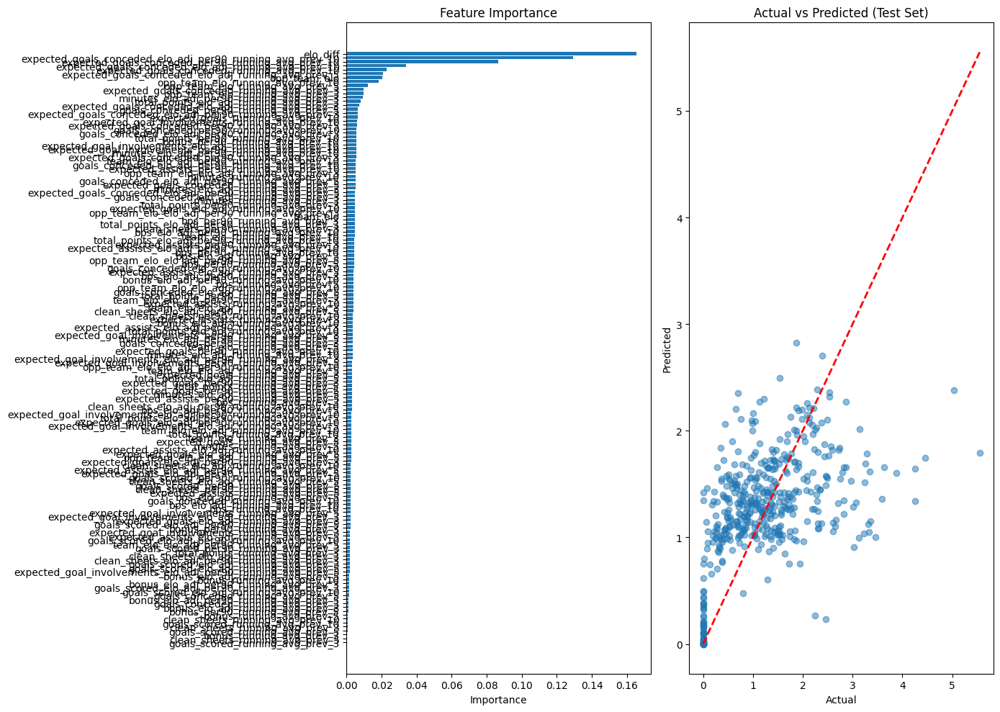

target=expected_goals_conceded_per90, MID_xGC_predictor
Cleaned df size: 10219/16507

Training Set Performance:
R² Score: 0.6411
RMSE: 0.5684
MAE: 0.4300

Test Set Performance:
R² Score: 0.4841
RMSE: 0.7157
MAE: 0.5267

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.236970
           expected_goals_conceded_per90_running_avg_prev_10    0.151208
                 expected_goals_conceded_running_avg_prev_10    0.067430
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.054755
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.052159
                             opp_team_elo_running_avg_prev_3    0.025785
                                                opp_team_elo    0.023245
                             opp_team_elo_running_avg_prev_5    0.022526
                            opp_team_elo_running_avg_prev_10    0.020733
                    minutes_el

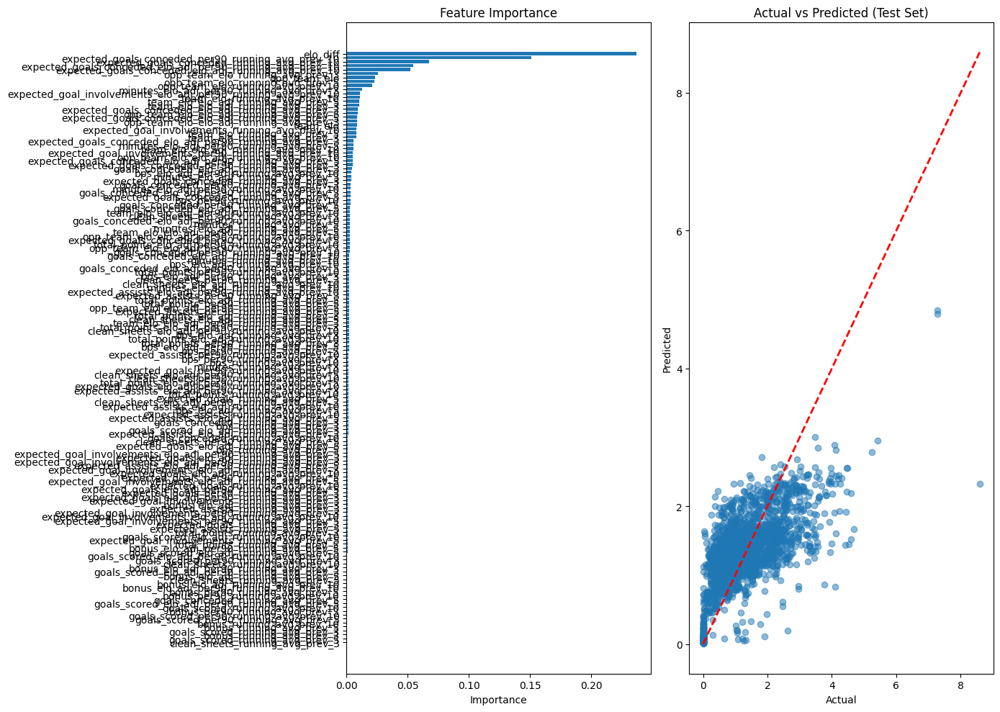

target=expected_goals_conceded_per90, DEF_xGC_predictor
Cleaned df size: 8825/14613

Training Set Performance:
R² Score: 0.6672
RMSE: 0.5534
MAE: 0.4165

Test Set Performance:
R² Score: 0.4911
RMSE: 0.6722
MAE: 0.5069

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.213564
           expected_goals_conceded_per90_running_avg_prev_10    0.212591
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.072121
                                                opp_team_elo    0.028870
                 expected_goals_conceded_running_avg_prev_10    0.023248
                             opp_team_elo_running_avg_prev_5    0.022813
                            opp_team_elo_running_avg_prev_10    0.021870
                             opp_team_elo_running_avg_prev_3    0.016902
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.016167
                     opp_team_e

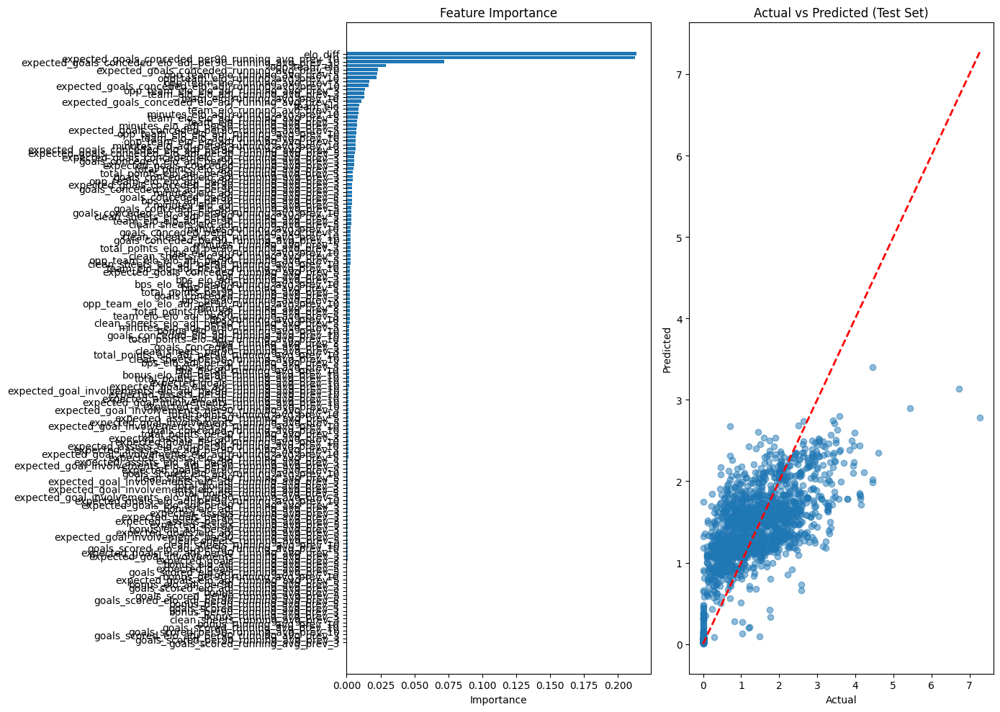

target=expected_goals_conceded_per90, GK_xGC_predictor
Cleaned df size: 2192/3571

Training Set Performance:
R² Score: 0.7385
RMSE: 0.4682
MAE: 0.3596

Test Set Performance:
R² Score: 0.3387
RMSE: 0.7882
MAE: 0.5886

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.188081
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.122001
           expected_goals_conceded_per90_running_avg_prev_10    0.082654
                 expected_goals_conceded_running_avg_prev_10    0.036831
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.035126
                                                opp_team_elo    0.032153
                            opp_team_elo_running_avg_prev_10    0.018588
          expected_goals_conceded_elo_adj_running_avg_prev_5    0.018147
             goals_conceded_elo_adj_per90_running_avg_prev_5    0.014594
                             opp_

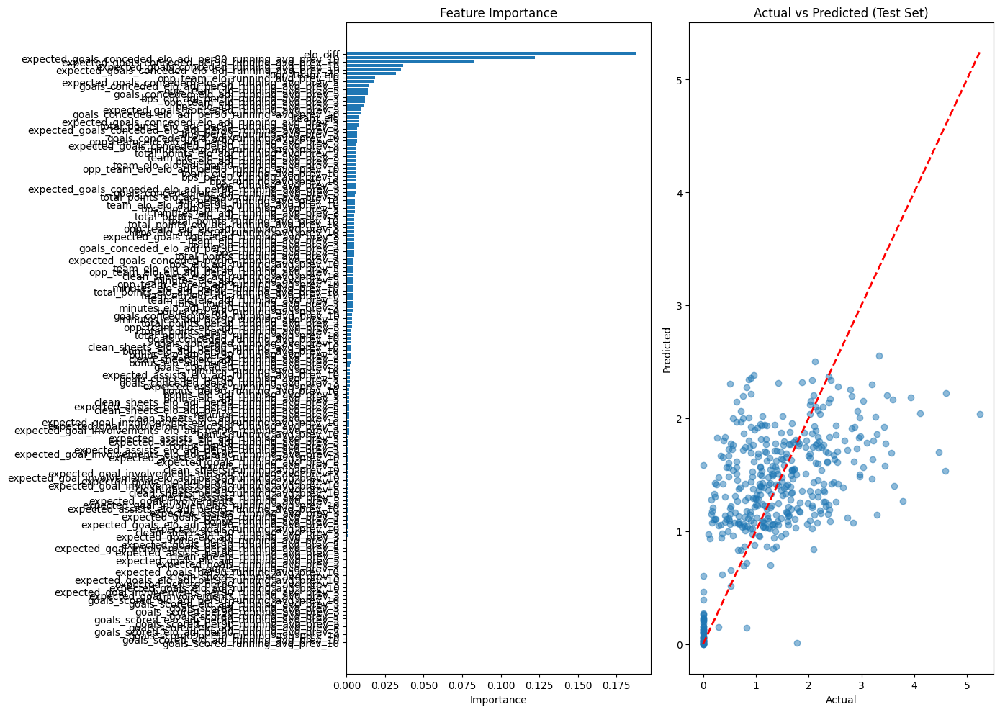

In [13]:
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>500)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=expected_goals_conceded_per90, FWD_xGC_predictor")
    FWD_xGC_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_conceded_per90',
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols)
    FWD_xGC_predictor.fit()
    FWD_xGC_predictor.plot_results()

    print("target=expected_goals_conceded_per90, MID_xGC_predictor")
    MID_xGC_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_conceded_per90',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_xGC_predictor.fit()
    MID_xGC_predictor.plot_results()
    
    print("target=expected_goals_conceded_per90, DEF_xGC_predictor")
    DEF_xGC_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_conceded_per90',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_xGC_predictor.fit()
    DEF_xGC_predictor.plot_results()

    print("target=expected_goals_conceded_per90, GK_xGC_predictor")
    GK_xGC_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_conceded_per90',
        positions={'GK'},
        columns_to_drop = cbi_defcon_cols)
    GK_xGC_predictor.fit()
    GK_xGC_predictor.plot_results()

target=bps_per90, FWD_bps_predictor
Cleaned df size: 2287/4002

Training Set Performance:
R² Score: 0.6209
RMSE: 11.8738
MAE: 9.7538

Test Set Performance:
R² Score: -0.0182
RMSE: 20.0317
MAE: 15.8688

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.072991
                                                opp_team_elo    0.030263
                            opp_team_elo_running_avg_prev_10    0.025746
                             opp_team_elo_running_avg_prev_5    0.020345
                             opp_team_elo_running_avg_prev_3    0.019340
                    minutes_elo_adj_per90_running_avg_prev_3    0.018557
                    minutes_elo_adj_per90_running_avg_prev_5    0.016789
                          goals_conceded_running_avg_prev_10    0.013074
                                bps_per90_running_avg_prev_5    0.012385
              clean_sheets_elo_adj_per90_running

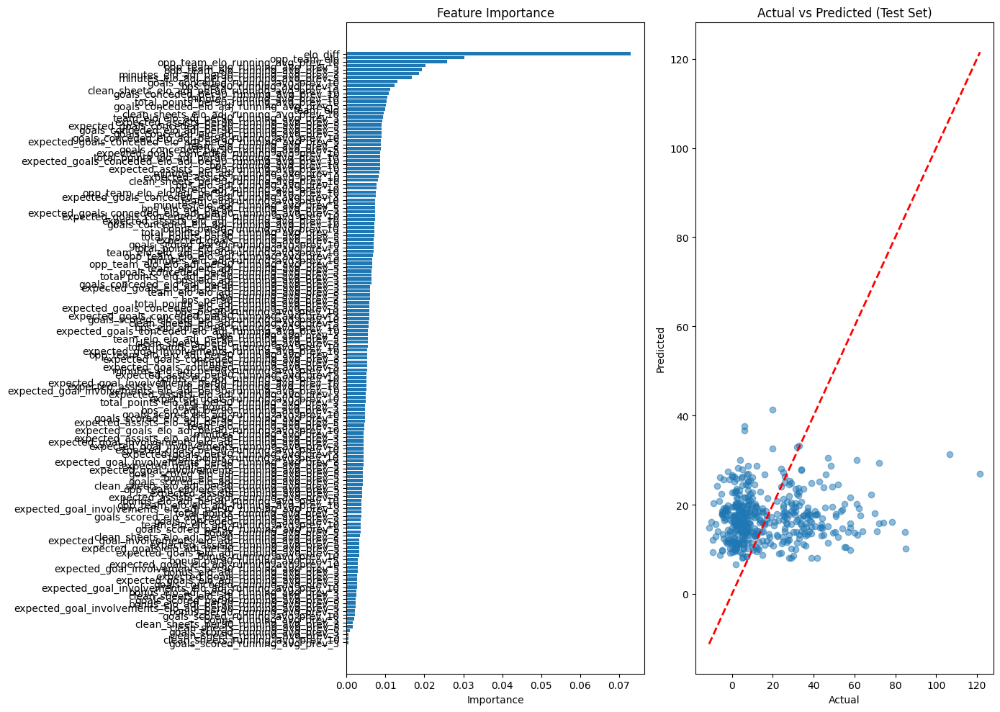

target=bps_per90, MID_bps_predictor
Cleaned df size: 10219/16507

Training Set Performance:
R² Score: 0.3991
RMSE: 9.1050
MAE: 6.9900

Test Set Performance:
R² Score: 0.0620
RMSE: 11.1755
MAE: 8.3329

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.102309
                             opp_team_elo_running_avg_prev_5    0.026142
                                                opp_team_elo    0.024123
                        expected_assists_running_avg_prev_10    0.021639
                expected_assists_elo_adj_running_avg_prev_10    0.020817
                                     bps_running_avg_prev_10    0.019773
                                bps_per90_running_avg_prev_3    0.014410
                             opp_team_elo_running_avg_prev_3    0.014325
                            opp_team_elo_running_avg_prev_10    0.014209
              expected_goal_involvements_running_

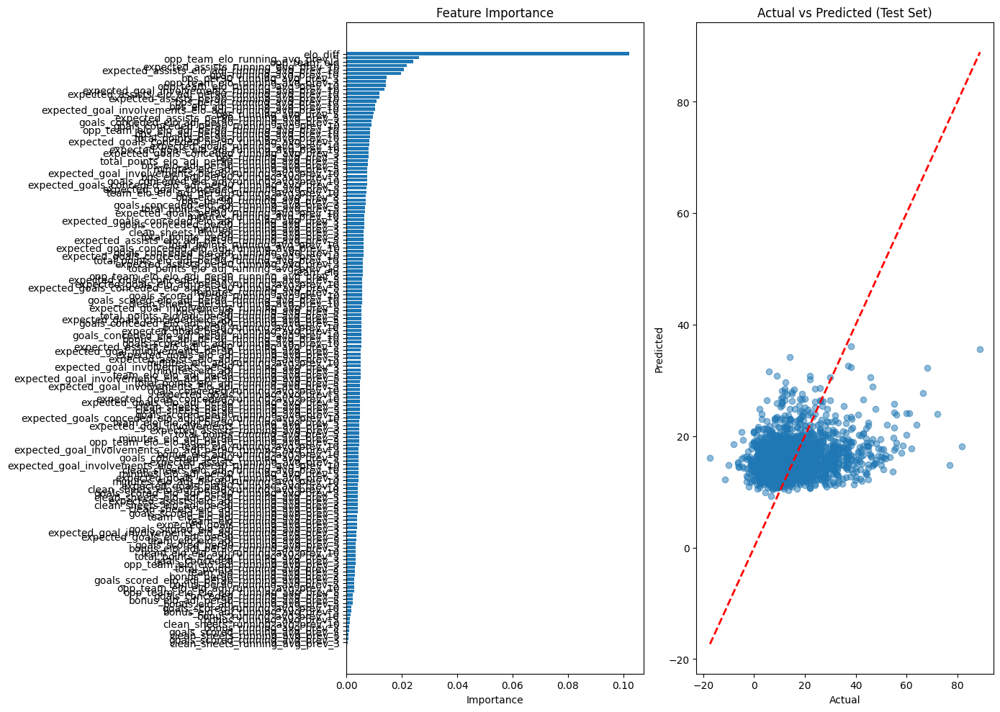

target=bps_per90, DEF_bps_predictor
Cleaned df size: 8825/14613

Training Set Performance:
R² Score: 0.5009
RMSE: 7.1622
MAE: 5.7460

Test Set Performance:
R² Score: 0.1597
RMSE: 9.1194
MAE: 7.2369

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.178595
                                                opp_team_elo    0.034089
                             opp_team_elo_running_avg_prev_5    0.024962
                             opp_team_elo_running_avg_prev_3    0.022325
                            opp_team_elo_running_avg_prev_10    0.019413
                               bps_per90_running_avg_prev_10    0.018765
                                team_elo_running_avg_prev_10    0.017339
                                                    team_elo    0.015387
                       bps_elo_adj_per90_running_avg_prev_10    0.012667
                                bps_per90_running_a

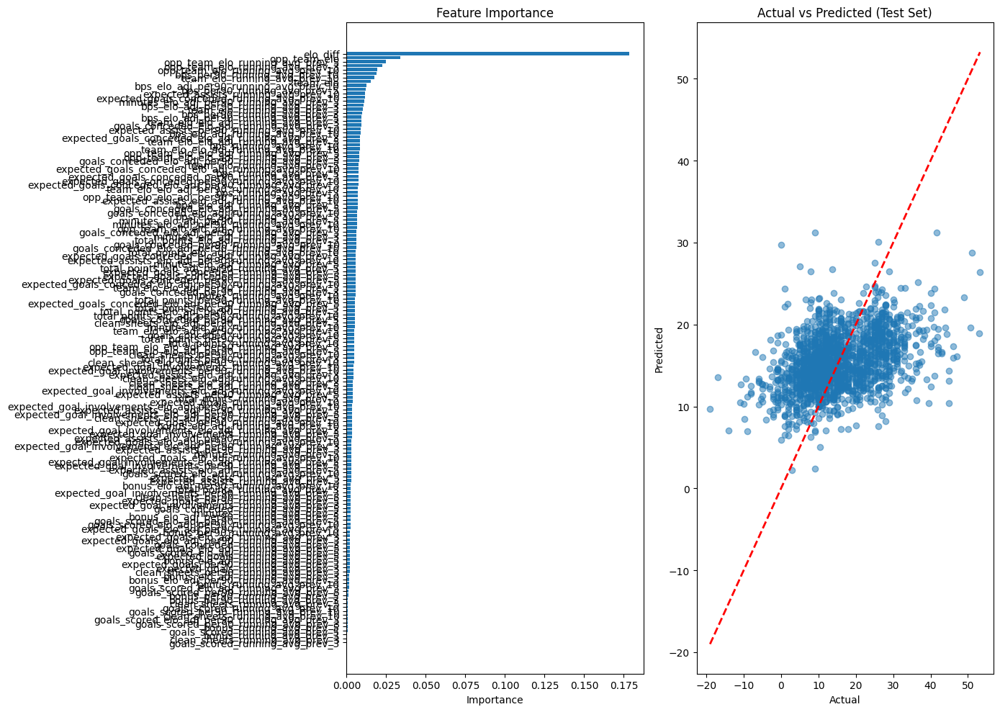

target=bps_per90, GK_bps_predictor
Cleaned df size: 2192/3571

Training Set Performance:
R² Score: 0.6844
RMSE: 5.1569
MAE: 4.2301

Test Set Performance:
R² Score: 0.0027
RMSE: 9.1758
MAE: 7.3618

Feature Importance:
                                                     feature  importance
                                                opp_team_elo    0.040472
                               bps_per90_running_avg_prev_10    0.036711
                             opp_team_elo_running_avg_prev_3    0.035484
                            opp_team_elo_running_avg_prev_10    0.034515
                             opp_team_elo_running_avg_prev_5    0.030595
                                                    elo_diff    0.027300
                                bps_per90_running_avg_prev_3    0.024173
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.019448
                                      bps_running_avg_prev_3    0.017611
                                     bps_running_avg_

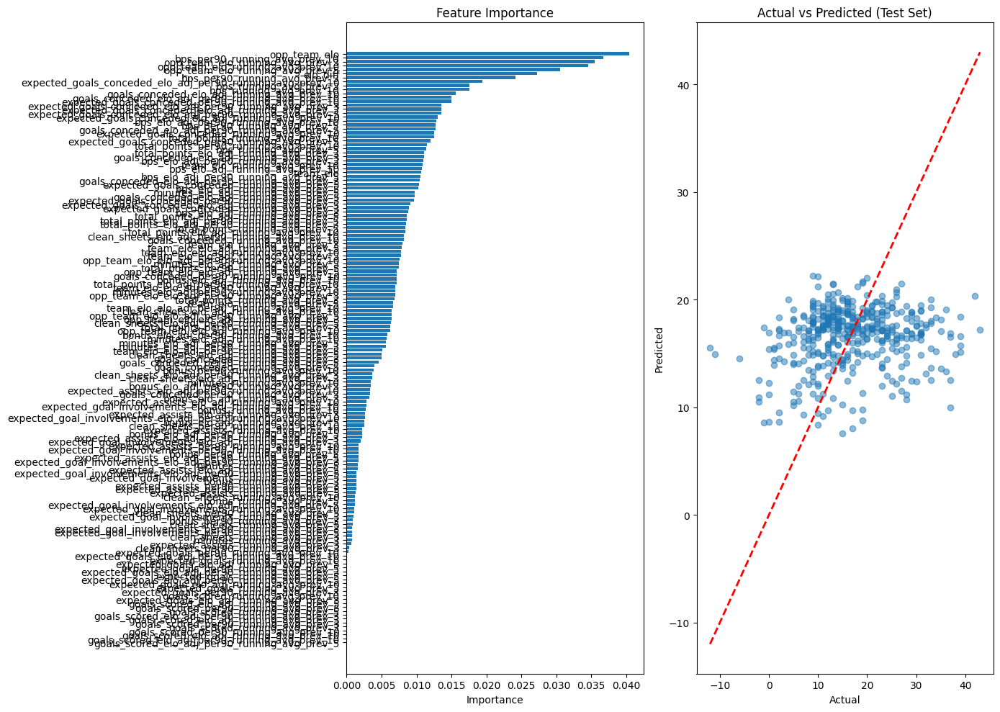

In [14]:
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>500)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=bps_per90, FWD_bps_predictor")
    FWD_bps_predictor = FPLPredictor(
        data=df[filtered],
        target='bps_per90', # try: 'bonus_per90'
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols)
    FWD_bps_predictor.fit()
    FWD_bps_predictor.plot_results()

    print("target=bps_per90, MID_bps_predictor")
    MID_bps_predictor = FPLPredictor(
        data=df[filtered],
        target='bps_per90',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_bps_predictor.fit()
    MID_bps_predictor.plot_results()
    
    print("target=bps_per90, DEF_bps_predictor")
    DEF_bps_predictor = FPLPredictor(
        data=df[filtered],
        target='bps_per90',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_bps_predictor.fit()
    DEF_bps_predictor.plot_results()

    print("target=bps_per90, GK_bps_predictor")
    GK_bps_predictor = FPLPredictor(
        data=df[filtered],
        target='bps_per90',
        positions={'GK'},
        columns_to_drop = cbi_defcon_cols)
    GK_bps_predictor.fit()
    GK_bps_predictor.plot_results()

target=saves_per90, GK_saves_predictor
Cleaned df size: 139/3741

Training Set Performance:
R² Score: 0.8495
RMSE: 0.6269
MAE: 0.5292

Test Set Performance:
R² Score: -0.2508
RMSE: 1.6269
MAE: 1.2989

Feature Importance:
                                                     feature  importance
                                 team_elo_running_avg_prev_5    0.043452
                             opp_team_elo_running_avg_prev_5    0.042294
                             bps_elo_adj_running_avg_prev_10    0.030215
                                team_elo_running_avg_prev_10    0.026667
                                recoveries_per90_alltime_avg    0.026425
            goals_conceded_elo_adj_per90_running_avg_prev_10    0.024133
                             opp_team_elo_running_avg_prev_3    0.023592
                            opp_team_elo_running_avg_prev_10    0.023260
                                                opp_team_elo    0.020601
                         team_elo_elo_adj_running

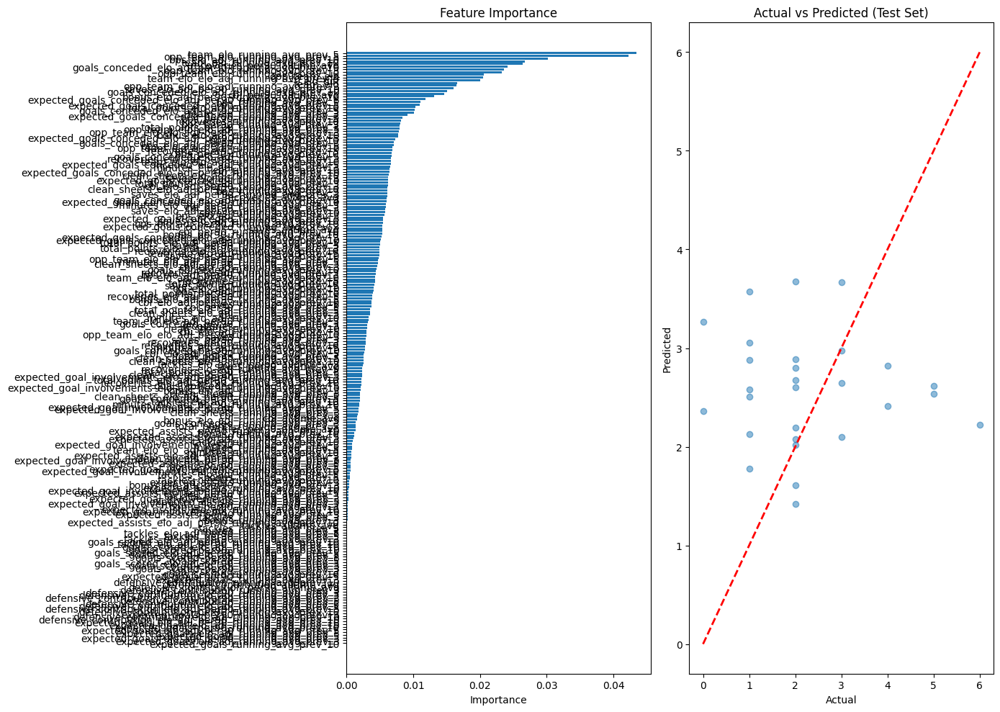

In [15]:
#shots saved
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>0)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=saves_per90, GK_saves_predictor")
    GK_saves_predictor = FPLPredictor(
    data=df[filtered],
    target='saves_per90',
    positions={'GK'})
    GK_saves_predictor.fit()
    GK_saves_predictor.plot_results()

target=defensive_contribution_per90, FWD_defcon_predictor
Cleaned df size: 146/4619

Training Set Performance:
R² Score: 0.8390
RMSE: 0.9506
MAE: 0.7198

Test Set Performance:
R² Score: -0.1693
RMSE: 3.4025
MAE: 2.5236

Feature Importance:
                                                     feature  importance
                         expected_assists_running_avg_prev_3    0.086980
                                                    elo_diff    0.033866
                                                opp_team_elo    0.032527
     defensive_contribution_elo_adj_per90_running_avg_prev_3    0.021045
                            opp_team_elo_running_avg_prev_10    0.019687
                   team_elo_elo_adj_per90_running_avg_prev_3    0.019032
                                                    team_elo    0.015632
                   minutes_elo_adj_per90_running_avg_prev_10    0.015592
                             opp_team_elo_running_avg_prev_5    0.014299
                              

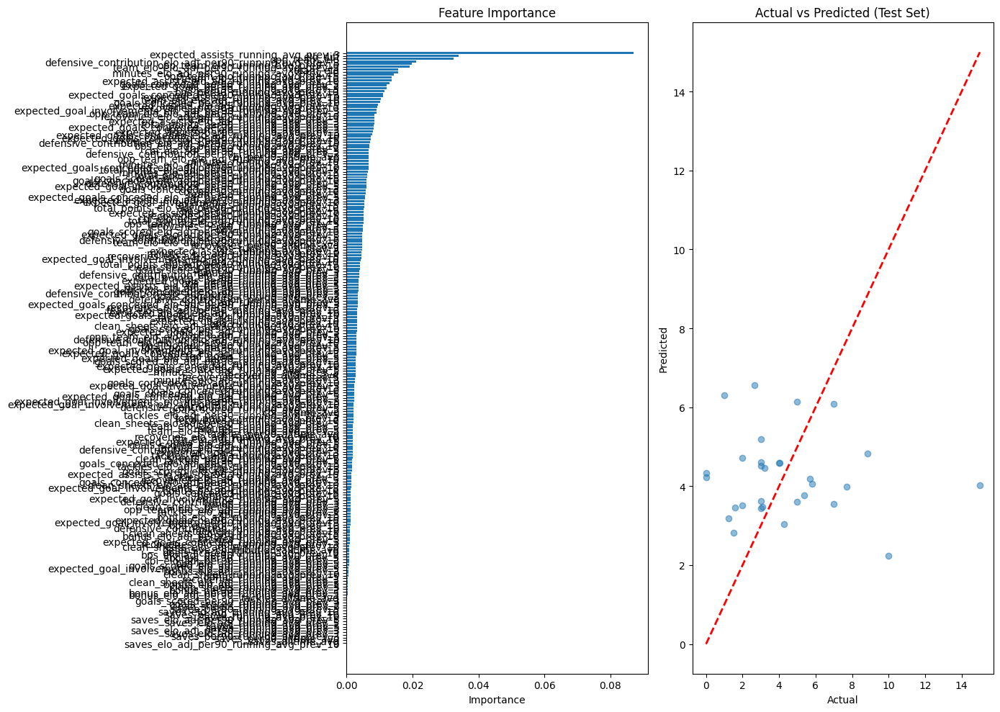

target=defensive_contribution_per90, MID_defcon_predictor
Cleaned df size: 731/18994

Training Set Performance:
R² Score: 0.8667
RMSE: 1.4648
MAE: 1.1701

Test Set Performance:
R² Score: 0.0947
RMSE: 3.8702
MAE: 3.1582

Feature Importance:
                                                     feature  importance
      expected_goal_involvements_elo_adj_running_avg_prev_10    0.037617
                           tackles_per90_running_avg_prev_10    0.034540
                          expected_goals_running_avg_prev_10    0.019326
                   tackles_elo_adj_per90_running_avg_prev_10    0.017842
                            tackles_per90_running_avg_prev_5    0.017603
                                                    elo_diff    0.015482
                                                opp_team_elo    0.015411
                       cbi_elo_adj_per90_running_avg_prev_10    0.015068
               total_points_elo_adj_per90_running_avg_prev_3    0.015016
              total_points_elo

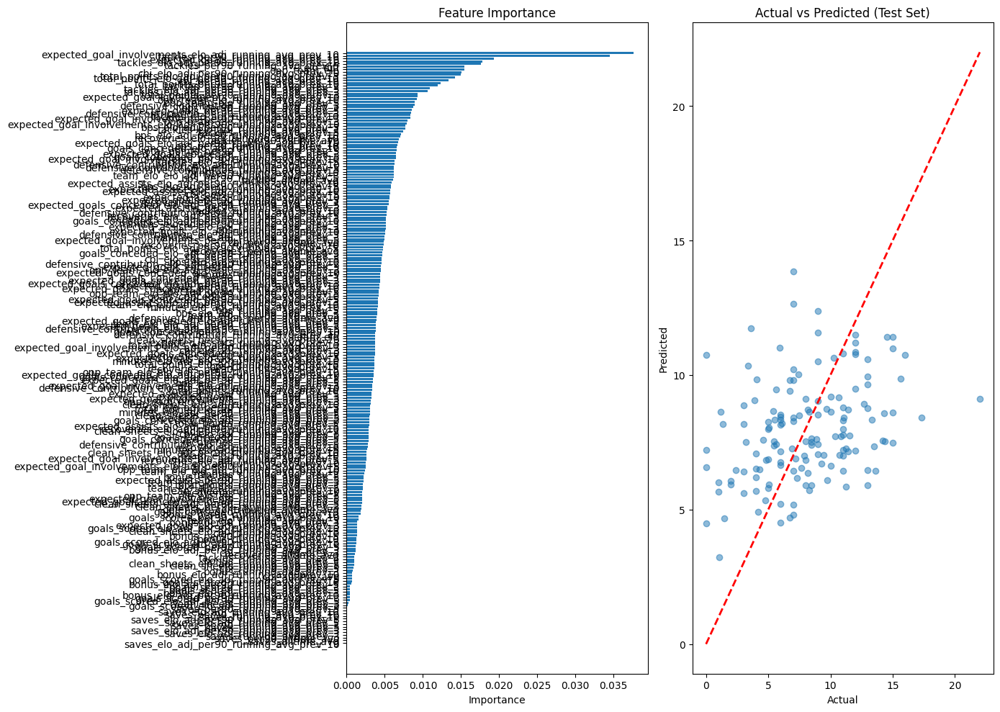

target=defensive_contribution_per90, DEF_defcon_predictor
Cleaned df size: 602/16062

Training Set Performance:
R² Score: 0.8257
RMSE: 1.5964
MAE: 1.2599

Test Set Performance:
R² Score: 0.1160
RMSE: 3.4149
MAE: 2.7314

Feature Importance:
                                                     feature  importance
                                                opp_team_elo    0.030868
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.029367
                                     cbi_running_avg_prev_10    0.026488
                                                    elo_diff    0.026310
                                             cbi_alltime_avg    0.024530
                                      cbi_running_avg_prev_3    0.022288
                                      cbi_running_avg_prev_5    0.019780
               opp_team_elo_elo_adj_per90_running_avg_prev_3    0.016931
                                       cbi_per90_alltime_avg    0.014774
    expected_goals_conceded_el

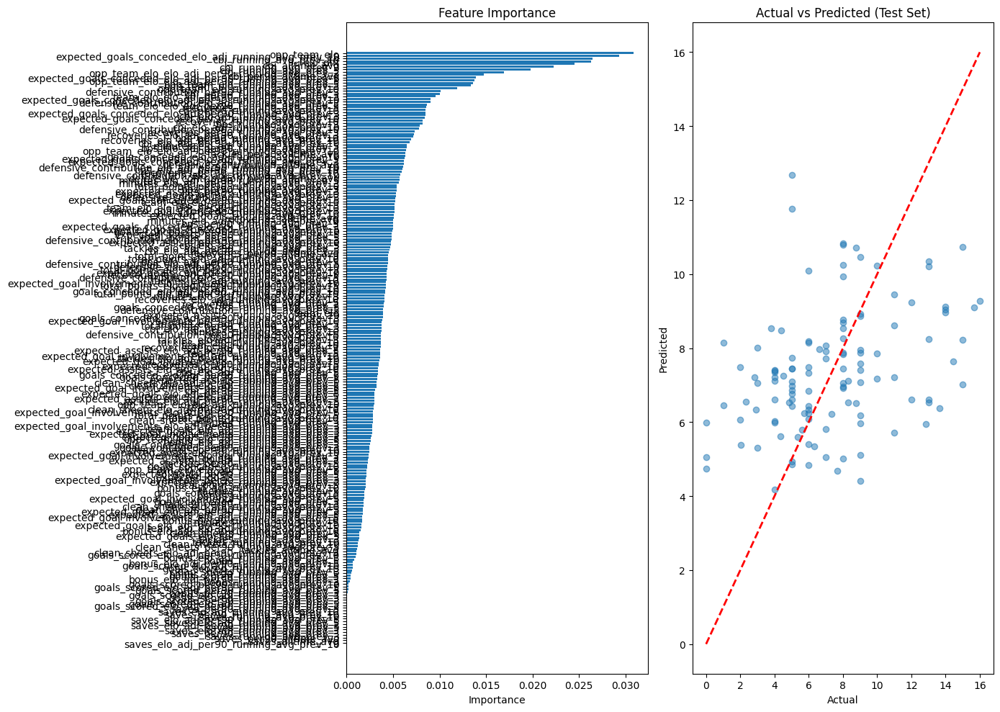

In [16]:
# >10 defcon (CBIT) for a defender
# >12 defcon (CBIT+R) for mid or fwd
filtered = (df['minutes']>30)&(df['player_season_minutes_total']>0)

if __name__ == "__main__":
    
    print("target=defensive_contribution_per90, FWD_defcon_predictor")
    FWD_defcon_predictor = FPLPredictor(
    data=df[filtered],
    target='defensive_contribution_per90',
    positions={'FWD'})
    FWD_defcon_predictor.fit()
    FWD_defcon_predictor.plot_results()

    print("target=defensive_contribution_per90, MID_defcon_predictor")
    MID_defcon_predictor = FPLPredictor(
    data=df[filtered],
    target='defensive_contribution_per90',
    positions={'MID'})
    MID_defcon_predictor.fit()
    MID_defcon_predictor.plot_results()

    print("target=defensive_contribution_per90, DEF_defcon_predictor")
    DEF_defcon_predictor = FPLPredictor(
    data=df[filtered],
    target='defensive_contribution_per90',
    positions={'DEF'})
    DEF_defcon_predictor.fit()
    DEF_defcon_predictor.plot_results()

Goals conceded per 90
Estimated λ (mean goals per match): 1.340


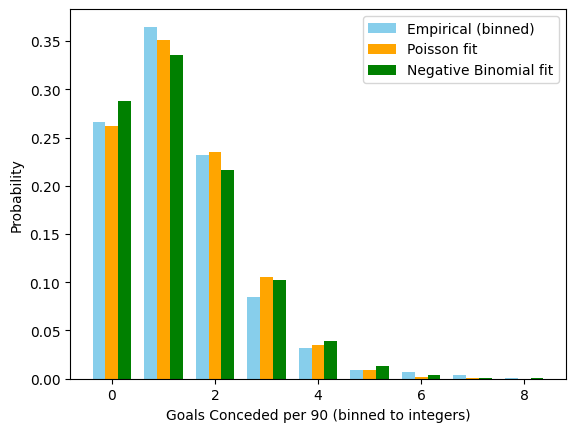

Mean: 1.332, Variance: 1.523
Overdispersion ratio (Var/Mean): 1.143
✅ Poisson assumption looks reasonable.
P(X < 1 goal) = 0.262


In [17]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import poisson, nbinom
print("Goals conceded per 90")

# Compute xGC per 90
df['xgc_p90'] = (df['expected_goals_conceded'] / df['minutes']) * 90

# Filter to reasonable samples
data = df[(df['minutes'] > 0) & (df['xgc_p90'] < 8)]['xgc_p90']

# Estimate λ
lambda_hat = np.mean(data)
print(f"Estimated λ (mean goals per match): {lambda_hat:.3f}")

# --- BINNING into discrete Poisson-like counts ---
binned = np.round(data).astype(int)
binned = np.clip(binned, 0, None)

# Empirical frequencies
values, counts = np.unique(binned, return_counts=True)
prob_empirical = counts / counts.sum()

# --- Poisson PMF ---
poisson_pmf = poisson.pmf(values, mu=lambda_hat)

# --- Negative Binomial PMF (method of moments) ---
mean_val = np.mean(binned)
var_val = np.var(binned, ddof=1)

if var_val > mean_val:
    r = (mean_val ** 2) / (var_val - mean_val)
    p = r / (r + mean_val)
    negbin_pmf = nbinom.pmf(values, n=r, p=p)
else:
    negbin_pmf = np.zeros_like(values)
    print("Variance ≤ Mean → NB undefined, skipping NB plot.")

# --- Plot ---
plt.bar(values - 0.25, prob_empirical, width=0.25, label='Empirical (binned)', color='skyblue')
plt.bar(values, poisson_pmf, width=0.25, label='Poisson fit', color='orange')
plt.bar(values + 0.25, negbin_pmf, width=0.25, label='Negative Binomial fit', color='green')
plt.xlabel('Goals Conceded per 90 (binned to integers)')
plt.ylabel('Probability')
plt.legend()
plt.show()

# --- Dispersion diagnostics ---
overdispersion_ratio = var_val / mean_val
print(f"Mean: {mean_val:.3f}, Variance: {var_val:.3f}")
print(f"Overdispersion ratio (Var/Mean): {overdispersion_ratio:.3f}")

if overdispersion_ratio > 1.2:
    print("⚠️ Likely overdispersed → Negative Binomial may fit better.")
else:
    print("✅ Poisson assumption looks reasonable.")

# --- Example probability ---
p_less_than_1 = poisson.cdf(0, mu=lambda_hat)
print(f"P(X < 1 goal) = {p_less_than_1:.3f}")


Mids & Forwards
Estimated λ (mean defcon per 90): 8.240


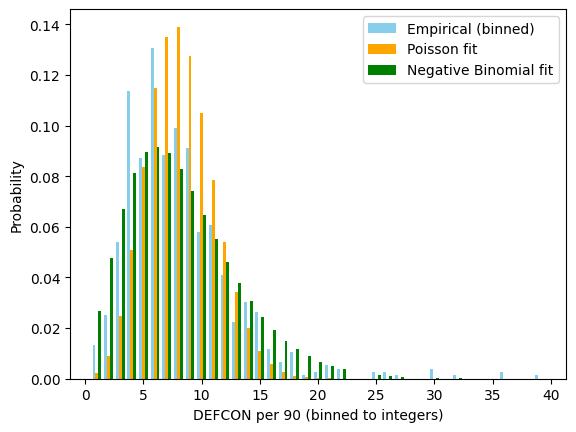

Mean: 8.235, Variance: 23.249
Overdispersion ratio (Var/Mean): 2.823
⚠️ Likely overdispersed → Negative Binomial may fit better.


In [18]:
#Test if defcon_p90 is neg binom distributed

import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import poisson, nbinom
print("Mids & Forwards")

# Filter to reasonable samples
data = df[(df['minutes'] > 0)
          & (df['defensive_contribution_per90'] > 0) 
          & (df['defensive_contribution_per90'] < 40)
          & (df['position'].isin(['DEF']))]['defensive_contribution_per90']

# Estimate λ
lambda_hat = np.mean(data)
print(f"Estimated λ (mean defcon per 90): {lambda_hat:.3f}")

# --- BINNING into discrete Poisson-like counts ---
binned = np.round(data).astype(int)
binned = np.clip(binned, 0, None)

# Empirical frequencies
values, counts = np.unique(binned, return_counts=True)
prob_empirical = counts / counts.sum()

# --- Poisson PMF ---
poisson_pmf = poisson.pmf(values, mu=lambda_hat)

# --- Negative Binomial PMF (method of moments) ---
mean_val = np.mean(binned)
var_val = np.var(binned, ddof=1)

if var_val > mean_val:
    r = (mean_val ** 2) / (var_val - mean_val)
    p = r / (r + mean_val)
    negbin_pmf = nbinom.pmf(values, n=r, p=p)
else:
    negbin_pmf = np.zeros_like(values)
    print("Variance ≤ Mean → NB undefined, skipping NB plot.")

# --- Plot ---
plt.bar(values - 0.25, prob_empirical, width=0.25, label='Empirical (binned)', color='skyblue')
plt.bar(values, poisson_pmf, width=0.25, label='Poisson fit', color='orange')
plt.bar(values + 0.25, negbin_pmf, width=0.25, label='Negative Binomial fit', color='green')
plt.xlabel('DEFCON per 90 (binned to integers)')
plt.ylabel('Probability')
plt.legend()
plt.show()

# --- Dispersion diagnostics ---
overdispersion_ratio = var_val / mean_val
print(f"Mean: {mean_val:.3f}, Variance: {var_val:.3f}")
print(f"Overdispersion ratio (Var/Mean): {overdispersion_ratio:.3f}")

if overdispersion_ratio > 1.2:
    print("⚠️ Likely overdispersed → Negative Binomial may fit better.")
else:
    print("✅ Poisson assumption looks reasonable.")


GK saves per 90
Estimated λ (mean defcon per 90): 3.218


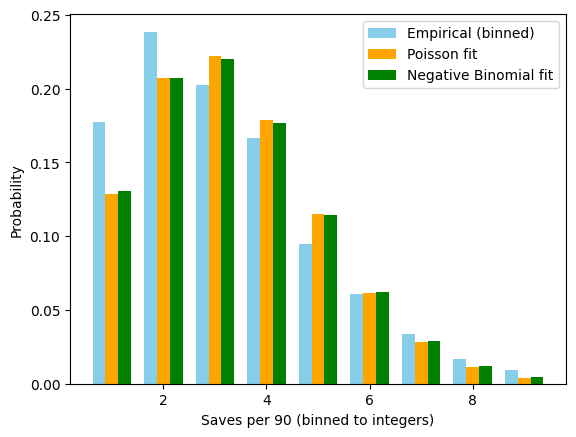

Mean: 3.218, Variance: 3.287
Overdispersion ratio (Var/Mean): 1.022
✅ Poisson assumption looks reasonable.


In [19]:
#Test if saves_p90 is neg binom distributed

import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import poisson, nbinom
print("GK saves per 90")

# Filter to reasonable samples
data = df[#(df['minutes'] > 0)
          (df['saves_per90'] > 0) 
          & (df['saves_per90'] < 10)
          & (df['position'].isin(['GK']))]['saves_per90']

# Estimate λ
lambda_hat = np.mean(data)
print(f"Estimated λ (mean defcon per 90): {lambda_hat:.3f}")

# --- BINNING into discrete Poisson-like counts ---
binned = np.round(data).astype(int)
binned = np.clip(binned, 0, None)

# Empirical frequencies
values, counts = np.unique(binned, return_counts=True)
prob_empirical = counts / counts.sum()

# --- Poisson PMF ---
poisson_pmf = poisson.pmf(values, mu=lambda_hat)

# --- Negative Binomial PMF (method of moments) ---
mean_val = np.mean(binned)
var_val = np.var(binned, ddof=1)

if var_val > mean_val:
    r = (mean_val ** 2) / (var_val - mean_val)
    p = r / (r + mean_val)
    negbin_pmf = nbinom.pmf(values, n=r, p=p)
else:
    negbin_pmf = np.zeros_like(values)
    print("Variance ≤ Mean → NB undefined, skipping NB plot.")

# --- Plot ---
plt.bar(values - 0.25, prob_empirical, width=0.25, label='Empirical (binned)', color='skyblue')
plt.bar(values, poisson_pmf, width=0.25, label='Poisson fit', color='orange')
plt.bar(values + 0.25, negbin_pmf, width=0.25, label='Negative Binomial fit', color='green')
plt.xlabel('Saves per 90 (binned to integers)')
plt.ylabel('Probability')
plt.legend()
plt.show()

# --- Dispersion diagnostics ---
overdispersion_ratio = var_val / mean_val
print(f"Mean: {mean_val:.3f}, Variance: {var_val:.3f}")
print(f"Overdispersion ratio (Var/Mean): {overdispersion_ratio:.3f}")

if overdispersion_ratio > 1.2:
    print("⚠️ Likely overdispersed → Negative Binomial may fit better.")
else:
    print("✅ Poisson assumption looks reasonable.")


                                 OLS Regression Results                                
Dep. Variable:                  bonus   R-squared (uncentered):                   0.446
Model:                            OLS   Adj. R-squared (uncentered):              0.446
Method:                 Least Squares   F-statistic:                          3.122e+04
Date:                Tue, 11 Nov 2025   Prob (F-statistic):                        0.00
Time:                        14:13:33   Log-Likelihood:                         -36627.
No. Observations:               38831   AIC:                                  7.326e+04
Df Residuals:                   38830   BIC:                                  7.327e+04
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

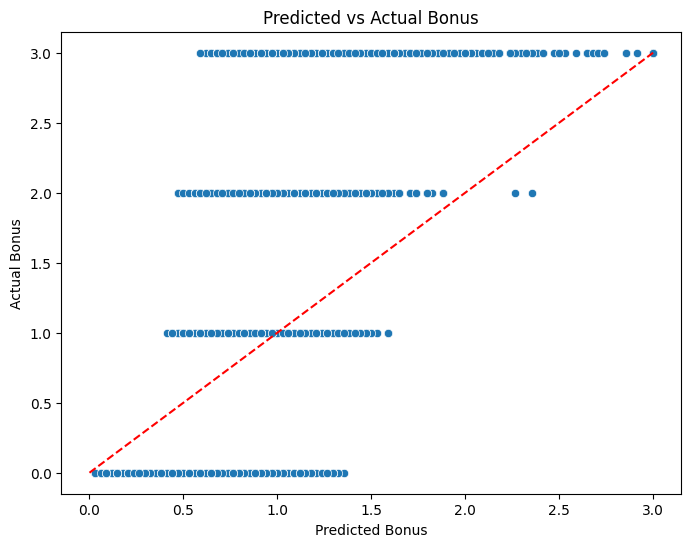

Actual Bonus       0.0       1.0       2.0       3.0
Position                                            
DEF           0.459423  0.232840  1.111908  1.954157
FWD           0.332705  0.201598  1.049845  1.712419
GK            0.492185  0.247359  1.120003  2.014407
GKP                NaN       NaN       NaN       NaN
MID           0.393360  0.248517  1.052256  1.831143


In [20]:
# Generalize the relationship between bps & bonus points
import statsmodels.formula.api as smf
filtered = (df['minutes']>45) & (df['bonus']>=0) & (df['bps']>0) & (df['position'].isin(['GK','DEF','MID','FWD']))
# df['bonus_sq'] = df['bonus']**2

model = smf.ols('bonus ~ bps -1', data=df[filtered]).fit()
print(model.summary())

df['bonus_pred'] = model.predict(df[filtered])
df['bonus_pred'] = np.clip(df['bonus_pred'], 0, 3) # clip prediction to 3

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8,6))
sns.scatterplot(x='bonus_pred', y='bonus', data=df)
plt.plot([df['bonus'].min(), df['bonus'].max()],
         [df['bonus'].min(), df['bonus'].max()],
         color='red', linestyle='--')  # 45-degree line
plt.xlabel('Predicted Bonus')
plt.ylabel('Actual Bonus')
plt.title('Predicted vs Actual Bonus')
plt.show()

import pandas as pd
import numpy as np

# Function to calculate RMSE
def rmse(actual, predicted):
    return np.sqrt(np.mean((actual - predicted) ** 2))

# Group by position and actual bonus, then calculate RMSE
rmse_table = df.groupby(['position', 'bonus']).apply(lambda x: rmse(x['bonus'], x['bonus_pred']))

# Convert to DataFrame
rmse_table = rmse_table.reset_index()
rmse_table.columns = ['Position', 'Actual Bonus', 'RMSE']

pivot_rmse = rmse_table.pivot(index='Position', columns='Actual Bonus', values='RMSE')
print(pivot_rmse)


In [21]:
prediction_data = df[(df['season']==20252026)
                     &(df['event']>=stats_current_gameweek)]

In [22]:
def predict_target_vectorized(df, model_dict, col_name):
    preds = []
    
    for pos, model in model_dict.items():
        subset = df[df['position'] == pos]
        if not subset.empty:
            pos_preds = model.predict_new(subset)
            temp = subset.copy()
            temp[col_name] = pos_preds
            preds.append(temp)
    
    if not preds:
        # If no positions matched at all
        return pd.Series(index=df.index, dtype=float)
    
    result = pd.concat(preds)
    
    # Safely align back to original DataFrame
    output = pd.Series(index=df.index, dtype=float)
    output.loc[result.index] = result[col_name]
    return output

In [23]:
target_col_name = 'mins_pred'
mins_model_dict = {'FWD': FWD_mins_predictor, 'MID': MID_mins_predictor, 'DEF': DEF_mins_predictor, 'GK': GK_mins_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, mins_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_23320\2521843321.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, mins_model_dict, col_name=target_col_name)


count    13230.000000
mean        43.999341
std         27.773381
min          0.967904
25%         18.312266
50%         42.598442
75%         73.656785
max         87.793831
Name: mins_pred, dtype: float64

In [24]:
target_col_name = 'xgp90_pred'
xg_model_dict = {'FWD': FWD_xG_predictor, 'MID': MID_xG_predictor, 'DEF': DEF_xG_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xg_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_23320\365369552.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xg_model_dict, col_name=target_col_name)


count    12390.000000
mean         0.152034
std          0.140812
min          0.017896
25%          0.051233
50%          0.103810
75%          0.193020
max          1.063590
Name: xgp90_pred, dtype: float64

In [25]:
target_col_name = 'xap90_pred'
xA_model_dict = {'FWD': FWD_xA_predictor, 'MID': MID_xA_predictor, 'DEF': DEF_xA_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xA_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_23320\4144355699.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xA_model_dict, col_name=target_col_name)


count    12390.000000
mean         0.086723
std          0.052775
min          0.008430
25%          0.048522
50%          0.075777
75%          0.115460
max          0.376249
Name: xap90_pred, dtype: float64

In [26]:
target_col_name = 'xgcp90_pred'
xGC_model_dict = {'FWD': FWD_xGC_predictor, 'MID': MID_xGC_predictor, 'DEF': DEF_xGC_predictor, 'GK':GK_xGC_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xGC_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_23320\682035545.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xGC_model_dict, col_name=target_col_name)


count    13230.000000
mean         1.462613
std          0.394527
min          0.354219
25%          1.176703
50%          1.426864
75%          1.711910
max          3.944283
Name: xgcp90_pred, dtype: float64

In [27]:
target_col_name = 'xbpsp90_pred'
bps_model_dict = {'FWD': FWD_bps_predictor, 'MID': MID_bps_predictor, 'DEF': DEF_bps_predictor, 'GK':GK_bps_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, bps_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_23320\3051138591.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, bps_model_dict, col_name=target_col_name)


count    13230.000000
mean        15.985684
std          3.803539
min          4.762826
25%         13.477487
50%         15.470402
75%         17.872059
max         47.909870
Name: xbpsp90_pred, dtype: float64

In [28]:
target_col_name = 'xsavesp90_pred'
saves_model_dict = {'GK':GK_saves_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, saves_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_23320\803536942.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, saves_model_dict, col_name=target_col_name)


count    840.000000
mean       2.648490
std        0.482844
min        1.470000
25%        2.381044
50%        2.619643
75%        2.830000
max        4.540000
Name: xsavesp90_pred, dtype: float64

In [29]:
target_col_name = 'xdefconp90_pred'
defcon_model_dict = {'FWD': FWD_defcon_predictor, 'MID': MID_defcon_predictor, 'DEF': DEF_defcon_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, defcon_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_23320\2777375241.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, defcon_model_dict, col_name=target_col_name)


count    12390.000000
mean         7.586476
std          2.058798
min          1.968975
25%          6.243726
50%          7.652951
75%          9.027083
max         16.682431
Name: xdefconp90_pred, dtype: float64

In [30]:
prediction_data[prediction_data['position']=='MID'].head()[["player_name_id","element","value","team_name","position","season","event","opp_team_name","opp_team_elo"
    ,'mins_pred','xgp90_pred','xap90_pred','xgcp90_pred'
    ]]

,player_name_id,element,value,team_name,position,season,event,opp_team_name,opp_team_elo,mins_pred,xgp90_pred,xap90_pred,xgcp90_pred
129708,Antoni Milambo,122.0,53.0,Brentford,MID,20252026.0,9.0,Liverpool,1219.276163,2.881929,0.037596,0.038470,2.120466
129712,Antoni Milambo,122.0,53.0,Brentford,MID,20252026.0,10.0,Crystal Palace,1091.589784,3.008668,0.039376,0.045943,1.724735
129716,Antoni Milambo,122.0,53.0,Brentford,MID,20252026.0,11.0,Newcastle,1096.205675,3.008668,0.039376,0.045288,1.748752
129723,Antoni Milambo,122.0,53.0,Brentford,MID,20252026.0,12.0,Brighton,1092.186587,3.008668,0.039376,0.045943,1.794808
129802,Antoni Milambo,122.0,53.0,Brentford,MID,20252026.0,13.0,Burnley,899.744173,3.312314,0.046295,0.109853,1.170826


In [31]:
prediction_data[
    (prediction_data['event']==picks_current_gameweek)
    &(prediction_data['mins_pred']>0)
    ][["player_name_id","element","value","team_name","position","season","event","opp_team_name","opp_team_elo"
    ,'mins_pred','xgp90_pred','xap90_pred','xgcp90_pred'
    ]].sort_values(by='xgp90_pred',ascending=False
        ).head(10)

,player_name_id,element,value,team_name,position,season,event,opp_team_name,opp_team_elo,mins_pred,xgp90_pred,xap90_pred,xgcp90_pred
133782,Eli Junior Kroupi,100.0,45.0,Bournemouth,FWD,20252026.0,11.0,Aston Villa,1129.223525,47.820688,0.690038,0.125108,1.880395
145634,Viktor GyÃ¶keres,666.0,90.0,Arsenal,FWD,20252026.0,11.0,Sunderland,1036.153451,57.825470,0.632444,0.150926,1.019585
138684,Liam Delap,250.0,62.0,Chelsea,FWD,20252026.0,11.0,Wolves,932.474999,2.917647,0.629492,0.089186,1.133379
139817,Lukas Nmecha,365.0,50.0,Leeds,FWD,20252026.0,11.0,Nott'm Forest,1012.476487,24.453848,0.627566,0.132212,1.982555
137181,Jean-Philippe Mateta,283.0,76.0,Crystal Palace,FWD,20252026.0,11.0,Brighton,1091.930861,70.193529,0.600776,0.111240,1.542172
132113,Charalampos Kostoulas,181.0,48.0,Brighton,FWD,20252026.0,11.0,Crystal Palace,1100.817637,28.131665,0.595635,0.070660,2.105345
138605,Kai Havertz,30.0,73.0,Arsenal,FWD,20252026.0,11.0,Sunderland,1036.153451,1.963067,0.585788,0.109810,1.176235
130819,Arnaud Kalimuendo,696.0,60.0,Nott'm Forest,FWD,20252026.0,11.0,Leeds,930.336223,7.565280,0.565560,0.153273,1.410677
145906,William Osula,500.0,55.0,Newcastle,FWD,20252026.0,11.0,Brentford,1055.481291,17.586580,0.553561,0.104006,1.794446
130409,Andrey Nascimento dos Santos,246.0,45.0,Chelsea,MID,20252026.0,11.0,Wolves,932.474999,34.426318,0.549772,0.108689,1.011809


In [32]:
import pandas as pd
from scipy.stats import nbinom

def calculate_negbinom_parameters(position_list, df):

    # 1. Calculate mean and variance
    filtered = (df['minutes'] > 0) & (df['defensive_contribution_per90'] > 0) & (df['defensive_contribution_per90'] < 40) & (df['position'].isin(position_list))
    mean = df[filtered]['defensive_contribution_per90'].mean()
    variance = df[filtered]['defensive_contribution_per90'].var()
    # r = number of successes
    r = (mean**2) / (variance - mean)
    # p = success probability
    p = r / (r + mean)
    return r,p

In [33]:
from scipy.stats import poisson
import numpy as np

def expected_score(mu, max_events=10, rule=None, points_per_n=None, points_value=None):
    """
    Calculate the expected score given an average event rate (mu)
    using a Poisson model.

    Parameters
    ----------
    mu : float
        Expected number of events (e.g., goals conceded, shots saved).
    max_events : int
        Maximum number of discrete events to sum over.
    rule : callable, optional
        Function that maps event count -> points. Example: lambda k: -np.floor(k / 2)
    points_per_n : int, optional
        For simple rules: number of events required for one point (e.g. 3 shots saved = 1 pt)
    points_value : float, optional
        Value of that one point (e.g. +1 for shots saved, -1 for goals conceded)

    Returns
    -------
    float
        Expected points based on Poisson-distributed event counts.
    """
    array = np.arange(0, max_events + 1)
    probs = poisson.pmf(array, mu)

    if rule is not None:
        scores = np.array([rule(k) for k in array])
    elif points_per_n is not None and points_value is not None:
        # General simple rule: 1 point_value for every n events
        scores = np.floor(array / points_per_n) * points_value
    else:
        raise ValueError("You must provide either a rule function or both points_per_n and points_value.")

    return np.sum(scores * probs)


In [34]:
scoring_dict = {
    "FWD": {'xgp90_pred': 4, 'xap90_pred': 3, 'xgcp90_pred': 0, 'xgc_ss':0, 'defcon':2},
    "MID": {'xgp90_pred': 5, 'xap90_pred': 3, 'xgcp90_pred': 1, 'xgc_ss':0, 'defcon':2},
    "DEF": {'xgp90_pred': 6, 'xap90_pred': 3, 'xgcp90_pred': 4, 'xgc_ss':-1, 'defcon':2},
    "GK":  {'xgp90_pred': 10, 'xap90_pred': 3, 'xgcp90_pred': 4, 'xgc_ss':-1, 'defcon':2}
}

def scoring(x, scoring_dict, points_type, negbinom_rp_dict=None):
    mins_factor = x['mins_pred']/90
    if points_type == 'mins':
        if pd.isna(x['mins_pred']):
            return 0
        elif x['mins_pred'] >= 60:
            return 2
        elif x['mins_pred'] > 0:
            return 1
        else:
            return 0
    if points_type == 'goals':
        goals_points = mins_factor * x['xgp90_pred'] * scoring_dict[x['position']]['xgp90_pred']
        return goals_points
    if points_type == 'assists':
        assist_points = mins_factor * x['xap90_pred'] * scoring_dict[x['position']]['xap90_pred']
        return assist_points
    if points_type == 'clean_sheets':
        p_less_than_1 = poisson.cdf(0, mu=x['xgcp90_pred'])
        cs_points = p_less_than_1 * scoring_dict[x['position']]['xgcp90_pred']
        return cs_points
    
    if points_type == 'shots_saved': 
        if x['position'] == 'GK':
            saves_points = expected_score(mu=x['xsavesp90_pred'],  # expected shots saved per 90
                                   max_events=15,
                                   points_per_n=3, #for every 3 shots saved
                                   points_value=1) #scores 1 point
            return saves_points
        else:
            return 0
        
    if points_type == 'goals_conceded':
        if x['position'] in ['DEF','GK']:
            gc_points = expected_score(mu=x['xgcp90_pred'], 
                                   max_events=10, 
                                   points_per_n=2, #for every 2 goals conceded 
                                   points_value=-1) #scores -1 points 
            return gc_points
        else:
            return 0

    if points_type == 'defcon':
        pos = x['position']
        if pos in ['MID','FWD']:
            r = negbinom_rp_dict[pos]['r']
            p = negbinom_rp_dict[pos]['p']
            k = 12
            prob_more_than_12 = 1 - nbinom.cdf(k, r, p)
            defcon_points = prob_more_than_12 * scoring_dict[pos]['defcon']
            return defcon_points
        elif pos == 'DEF':
            r = negbinom_rp_dict[pos]['r']
            p = negbinom_rp_dict[pos]['p']
            k = 10
            prob_more_than_12 = 1 - nbinom.cdf(k, r, p)
            defcon_points = prob_more_than_12 * scoring_dict[pos]['defcon']
            return defcon_points
        else: return 0

    if points_type == 'bonus':
        return x['xbpsp90_pred']*0.0294 # ols regression coefficient

prediction_data['xpoints_mins'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='mins'), axis=1)
prediction_data['xpoints_goals'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='goals'), axis=1)
prediction_data['xpoints_assists'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='assists'), axis=1)
prediction_data['xpoints_clean_sheets'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='clean_sheets'), axis=1)

prediction_data['xpoints_shots_saved'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='shots_saved'), axis=1)
prediction_data['xpoints_goals_conceded'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='goals_conceded'), axis=1)

def_r,def_p = calculate_negbinom_parameters(['DEF'], df)
mid_r,mid_p = calculate_negbinom_parameters(['MID'], df)
fwd_r,fwd_p = calculate_negbinom_parameters(['FWD'], df)
rp_dict = {'DEF':{'r':def_r,'p':def_p},'MID':{'r':mid_r,'p':mid_p},'FWD':{'r':fwd_r,'p':fwd_p}}
prediction_data['xpoints_defcon'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='defcon', negbinom_rp_dict=rp_dict), axis=1)
prediction_data['xpoints_bonus'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='bonus'), axis=1)

prediction_data['xpoints'] = prediction_data[['xpoints_mins', 'xpoints_goals', 'xpoints_assists', 'xpoints_clean_sheets',
                                              'xpoints_shots_saved','xpoints_goals_conceded','xpoints_defcon','xpoints_bonus']].sum(axis=1, skipna=True)

C:\Users\chris\AppData\Local\Temp\ipykernel_23320\282654768.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data['xpoints_mins'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='mins'), axis=1)
C:\Users\chris\AppData\Local\Temp\ipykernel_23320\282654768.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data['xpoints_goals'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='goals'), axis=1)
C:\Users\chris\AppData\Local\Temp\ipykernel_

In [35]:
predictions = prediction_data[['player_name_id', 'team_name','team_elo','element','position','opp_team_name','opp_team_elo', 'season', 'value', 'event',
                       'mins_pred', 'xgp90_pred', 'xap90_pred', 'xgcp90_pred',
                       'xpoints_mins', 'xpoints_goals', 'xpoints_assists', 'xpoints_clean_sheets','xpoints_shots_saved',
                       'xpoints_goals_conceded','xpoints_defcon','xpoints_bonus',
                       'xpoints']]
predictions

,player_name_id,team_name,team_elo,element,position,opp_team_name,opp_team_elo,season,value,event,...,xgcp90_pred,xpoints_mins,xpoints_goals,xpoints_assists,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_defcon,xpoints_bonus,xpoints
129676,Aaron Hickey,Brentford,1050.193538,116.0,DEF,Liverpool,1219.276163,20252026.0,40.0,9.0,...,2.138747,1,0.075700,0.021027,0.471209,0.000000,-0.822763,0.550928,0.327487,1.623588
129677,Aaron Hickey,Brentford,1064.709144,116.0,DEF,Crystal Palace,1091.589784,20252026.0,40.0,10.0,...,1.904791,1,0.015906,0.005952,0.595415,0.000000,-0.707908,0.550928,0.383080,1.843374
129678,Aaron Hickey,Brentford,1055.481291,116.0,DEF,Newcastle,1096.205675,20252026.0,40.0,11.0,...,1.904072,1,0.015906,0.005952,0.595843,0.000000,-0.707556,0.550928,0.401734,1.862808
129679,Aaron Hickey,Brentford,1066.648094,116.0,DEF,Brighton,1092.186587,20252026.0,40.0,12.0,...,1.898644,1,0.015906,0.005952,0.599087,0.000000,-0.704903,0.550928,0.383080,1.850051
129681,Aaron Hickey,Brentford,1066.648094,116.0,DEF,Burnley,899.744173,20252026.0,40.0,13.0,...,1.168220,1,0.016205,0.006529,1.243680,0.000000,-0.358277,0.550928,0.524947,2.984012
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146417,ÄorÄe PetroviÄ,Bournemouth,1068.336869,67.0,GK,Leeds,922.657325,20252026.0,45.0,34.0,...,1.199931,2,NaN,NaN,1.204860,0.563307,-0.372648,0.000000,0.531373,3.926892
146418,ÄorÄe PetroviÄ,Bournemouth,1068.336869,67.0,GK,Crystal Palace,1100.561911,20252026.0,45.0,35.0,...,1.590489,2,NaN,NaN,0.815303,0.546823,-0.555626,0.000000,0.496138,3.302639
146419,ÄorÄe PetroviÄ,Bournemouth,1068.336869,67.0,GK,Fulham,1016.160200,20252026.0,45.0,36.0,...,1.286938,2,NaN,NaN,1.104460,0.553412,-0.412528,0.000000,0.506928,3.752272
146420,ÄorÄe PetroviÄ,Bournemouth,1068.336869,67.0,GK,Man City,1229.841438,20252026.0,45.0,37.0,...,1.720655,2,NaN,NaN,0.715796,0.543532,-0.618323,0.000000,0.490387,3.131392


In [36]:
prediction_data.columns.to_list()

['player_name_id',
 'element',
 'season',
 'value',
 'event',
 'minutes',
 'total_points',
 'team_elo',
 'opp_team_elo',
 'position',
 'goals_scored',
 'bonus',
 'bps',
 'clean_sheets',
 'goals_conceded',
 'was_home',
 'expected_goals',
 'expected_assists',
 'expected_goal_involvements',
 'expected_goals_conceded',
 'team_name',
 'opp_team_name',
 'cbi',
 'defensive_contribution',
 'recoveries',
 'tackles',
 'saves',
 'player_season_minutes_total',
 'player_season_points_per90',
 'points_per90',
 'expected_goals_per90',
 'expected_assists_per90',
 'expected_goals_conceded_per90',
 'saves_per90',
 'bps_per90',
 'bonus_per90',
 'cbi_per90',
 'defensive_contribution_per90',
 'recoveries_per90',
 'tackles_per90',
 'elo_diff',
 'minutes_alltime_avg',
 'minutes_per90_alltime_avg',
 'minutes_running_avg_prev_3',
 'minutes_per90_running_avg_prev_3',
 'minutes_elo_adj_running_avg_prev_3',
 'minutes_elo_adj_per90_running_avg_prev_3',
 'minutes_running_avg_prev_5',
 'minutes_per90_running_avg_pre

In [37]:
prediction_data[
    (prediction_data['event']==picks_current_gameweek+1)
    &(prediction_data['mins_pred']>60)
    #&(prediction_data['position'].isin(['MID','FWD']))
    ][["player_name_id","element","value","team_name","position","event","opp_team_name","opp_team_elo"
    ,'mins_pred','xgp90_pred','xap90_pred','xdefconp90_pred','xbpsp90_pred','xpoints'
    ]].sort_values(by='xpoints',ascending=False
        ).head(10)

,player_name_id,element,value,team_name,position,event,opp_team_name,opp_team_elo,mins_pred,xgp90_pred,xap90_pred,xdefconp90_pred,xbpsp90_pred,xpoints
141511,Mohamed Salah,381.0,143.0,Liverpool,MID,12.0,Nott'm Forest,1020.155385,77.538292,0.520967,0.253978,3.218684,22.447050,6.379306
131808,Bryan Mbeumo,119.0,80.0,Man Utd,MID,12.0,Everton,1053.833047,78.627821,0.495167,0.214409,5.852119,21.601663,6.166024
137182,Jean-Philippe Mateta,283.0,76.0,Crystal Palace,FWD,12.0,Wolves,927.743430,70.216181,0.889396,0.118406,4.250578,28.340422,6.149564
135090,Gabriel dos Santos MagalhÃ£es,5.0,64.0,Arsenal,DEF,12.0,Spurs,1013.778114,84.326855,0.124925,0.090612,9.917943,19.876224,5.777724
132945,Daniel MuÃ±oz MejÃ­a,256.0,56.0,Crystal Palace,DEF,12.0,Wolves,927.743430,83.098499,0.059983,0.205126,5.964920,33.175445,5.728173
138410,JurriÃ«n Timber,8.0,60.0,Arsenal,DEF,12.0,Spurs,1013.778114,78.100202,0.131674,0.104763,5.408446,18.107197,5.704175
139273,Leandro Trossard,20.0,69.0,Arsenal,MID,12.0,Spurs,1013.778114,71.228892,0.318271,0.161371,5.588567,22.759937,5.401775
138206,JoÃ£o Pedro Junqueira de Jesus,249.0,75.0,Chelsea,FWD,12.0,Burnley,899.744173,75.476093,0.640160,0.083544,4.627326,23.815089,5.321427
131702,Bruno Borges Fernandes,449.0,89.0,Man Utd,MID,12.0,Everton,1053.833047,74.300691,0.295126,0.220771,10.296920,22.947429,5.277414
134217,Erling Haaland,430.0,147.0,Man City,FWD,12.0,Newcastle,1085.038872,79.659380,0.559428,0.074329,3.750954,27.761252,5.257821


In [38]:
prediction_data[
    (prediction_data['event']==picks_current_gameweek+1)
    &(prediction_data['mins_pred']>60)
    &(prediction_data['position']=='GK')
    ][["player_name_id","element","value","team_name","position","event","opp_team_name","opp_team_elo"
    ,'mins_pred','xpoints_clean_sheets','xpoints_shots_saved','xpoints_goals_conceded','xpoints_bonus','xpoints'
    ]].sort_values(by='xpoints',ascending=False
        ).head(10)

,player_name_id,element,value,team_name,position,event,opp_team_name,opp_team_elo,mins_pred,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_bonus,xpoints
133099,David Raya MartÃ­n,1.0,57.0,Arsenal,GK,12.0,Spurs,1013.778114,75.671905,1.785291,0.312681,-0.203157,0.548671,4.443485
133971,Emiliano MartÃ­nez Romero,32.0,50.0,Aston Villa,GK,12.0,Leeds,922.657325,87.538953,1.577063,0.486367,-0.254226,0.497142,4.306346
133137,Dean Henderson,253.0,50.0,Crystal Palace,GK,12.0,Wolves,927.743430,82.732712,1.469885,0.376378,-0.284314,0.473019,4.034968
146395,ÄorÄe PetroviÄ,67.0,45.0,Bournemouth,GK,12.0,West Ham,978.277514,87.338145,1.156148,0.536953,-0.391485,0.523825,3.825441
135137,Gianluigi Donnarumma,736.0,57.0,Man City,GK,12.0,Newcastle,1085.038872,86.661515,1.178720,0.517592,-0.382641,0.497825,3.811495
143689,Robert Lynch SÃ¡nchez,220.0,49.0,Chelsea,GK,12.0,Burnley,899.744173,73.844098,1.353893,0.276952,-0.320296,0.400374,3.710923
137793,Jordan Pickford,287.0,55.0,Everton,GK,12.0,Man Utd,1056.034467,84.857168,1.148138,0.562647,-0.394673,0.394370,3.710481
143737,Robin Roefs,670.0,46.0,Sunderland,GK,12.0,Fulham,1016.160200,87.739299,1.048194,0.499737,-0.436779,0.533529,3.644681
131703,CaoimhÃ­n Kelleher,101.0,45.0,Brentford,GK,12.0,Brighton,1092.186587,87.599392,0.873903,0.767915,-0.522470,0.336130,3.455478
144518,Senne Lammens,733.0,50.0,Man Utd,GK,12.0,Everton,1053.833047,82.386551,0.937256,0.534559,-0.489270,0.391462,3.374007


In [39]:
table_name = "predictions"
if __name__ == "__main__":
    db_creator.create_staging_table_then_insert_data(table_name, data=predictions)
    preds = db_creator.table_to_df(table_name=table_name)
    print(preds.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13230 entries, 0 to 13229
Data columns (total 23 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   player_name_id          13230 non-null  object 
 1   team_name               13230 non-null  object 
 2   team_elo                13230 non-null  float64
 3   element                 13230 non-null  float64
 4   position                13230 non-null  object 
 5   opp_team_name           13230 non-null  object 
 6   opp_team_elo            13230 non-null  float64
 7   season                  13230 non-null  float64
 8   value                   13230 non-null  float64
 9   event                   13230 non-null  float64
 10  mins_pred               13230 non-null  float64
 11  xgp90_pred              12390 non-null  float64
 12  xap90_pred              12390 non-null  float64
 13  xgcp90_pred             13230 non-null  float64
 14  xpoints_mins            13230 non-null

In [40]:
# Add new columns to the xPoints table
db_creator.execute_sql("""
    ALTER TABLE predictions
    ADD COLUMN IF NOT EXISTS in_any_team INTEGER DEFAULT 0,
    ADD COLUMN IF NOT EXISTS in_my_team INTEGER DEFAULT 0
""")

In [41]:
current_gameweek = picks_current_gameweek
my_name = "Christopher Harris"

# Get the player lists
view = db_creator.run_sql(f"""
    WITH 
    current_players AS (
        SELECT element
        FROM fpl_picks
        WHERE gw = {current_gameweek}
    ),
    my_players AS (
        SELECT element
        FROM fpl_picks
        WHERE gw = {current_gameweek}
        AND member = '{my_name}'
    )
    SELECT * FROM my_players
""")

# Update the flags
db_creator.execute_sql(f"""
    UPDATE predictions
    SET in_any_team = 1
    WHERE element IN (
        SELECT element 
        FROM fpl_picks 
        WHERE gw = {current_gameweek}
    )
""")

db_creator.execute_sql(f"""
    UPDATE predictions
    SET in_my_team = 1
    WHERE element IN (
        SELECT element 
        FROM fpl_picks 
        WHERE gw = {current_gameweek}
        AND member = '{my_name}'
    )
""")

In [42]:
print(f"Gameweek {picks_current_gameweek+1} Predictions")
prediction_data[
    prediction_data['event']==picks_current_gameweek+1
][["player_name_id","element",'event',"value","team_name","position","opp_team_name","opp_team_elo"
   ,'mins_pred', 'xpoints_mins', 'xpoints_goals', 'xpoints_assists', 'xpoints_clean_sheets', 
   'xpoints_shots_saved','xpoints_goals_conceded','xpoints_defcon','xpoints_bonus',
   'xpoints'
   ]].sort_values(by='xpoints',ascending=False
    ).head(10)

Gameweek 12 Predictions


,player_name_id,element,event,value,team_name,position,opp_team_name,opp_team_elo,mins_pred,xpoints_mins,xpoints_goals,xpoints_assists,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_defcon,xpoints_bonus,xpoints
141511,Mohamed Salah,381.0,12.0,143.0,Liverpool,MID,Nott'm Forest,1020.155385,77.538292,2,2.244160,0.656434,0.320224,0.0,0.000000,0.498545,0.659943,6.379306
131808,Bryan Mbeumo,119.0,12.0,80.0,Man Utd,MID,Everton,1053.833047,78.627821,2,2.162993,0.561949,0.307448,0.0,0.000000,0.498545,0.635089,6.166024
137182,Jean-Philippe Mateta,283.0,12.0,76.0,Crystal Palace,FWD,Wolves,927.743430,70.216181,2,2.775556,0.277134,0.000000,0.0,0.000000,0.263665,0.833208,6.149564
135090,Gabriel dos Santos MagalhÃ£es,5.0,12.0,64.0,Arsenal,DEF,Spurs,1013.778114,84.326855,2,0.702300,0.254700,1.870209,0.0,-0.184773,0.550928,0.584361,5.777724
132945,Daniel MuÃ±oz MejÃ­a,256.0,12.0,56.0,Crystal Palace,DEF,Wolves,927.743430,83.098499,2,0.332299,0.568190,1.560179,0.0,-0.258781,0.550928,0.975358,5.728173
138410,JurriÃ«n Timber,8.0,12.0,60.0,Arsenal,DEF,Spurs,1013.778114,78.100202,2,0.685582,0.272733,1.851328,0.0,-0.188749,0.550928,0.532352,5.704175
139273,Leandro Trossard,20.0,12.0,69.0,Arsenal,MID,Spurs,1013.778114,71.228892,2,1.259450,0.383143,0.591496,0.0,0.000000,0.498545,0.669142,5.401775
138206,JoÃ£o Pedro Junqueira de Jesus,249.0,12.0,75.0,Chelsea,FWD,Burnley,899.744173,75.476093,2,2.147413,0.210186,0.000000,0.0,0.000000,0.263665,0.700164,5.321427
131702,Bruno Borges Fernandes,449.0,12.0,89.0,Man Utd,MID,Everton,1053.833047,74.300691,2,1.218226,0.546782,0.339207,0.0,0.000000,0.498545,0.674654,5.277414
134217,Erling Haaland,430.0,12.0,147.0,Man City,FWD,Newcastle,1085.038872,79.659380,2,1.980608,0.197366,0.000000,0.0,0.000000,0.263665,0.816181,5.257821


In [43]:
current_gameweek=picks_current_gameweek
print(f"Next 5 GWs: GW{current_gameweek} - GW{current_gameweek+5}")
next_5_gws_filter = (prediction_data['event']>=current_gameweek)&(prediction_data['event']<=current_gameweek+5)
prediction_data[next_5_gws_filter].groupby('player_name_id')[['mins_pred', 'xpoints_mins', 'xpoints_goals', 
                                           'xpoints_assists', 'xpoints_clean_sheets', 'xpoints_shots_saved','xpoints_goals_conceded','xpoints_defcon','xpoints_bonus',
                                           'xpoints'
                                           ]].agg('sum').reset_index().sort_values(by='xpoints',ascending=False).head(10)

Next 5 GWs: GW11 - GW16


,player_name_id,mins_pred,xpoints_mins,xpoints_goals,xpoints_assists,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_defcon,xpoints_bonus,xpoints
55,Bryan Mbeumo,472.542680,12,13.850184,3.502731,1.847818,0.0,0.000000,2.991271,4.291491,38.483495
310,Mohamed Salah,468.328528,12,12.876433,3.805175,1.761356,0.0,0.000000,2.991271,3.795923,37.230157
119,Erling Haaland,470.833936,12,14.336301,1.239229,0.000000,0.0,0.000000,1.581993,5.222734,34.380255
53,Bruno Borges Fernandes,446.765873,12,8.651335,3.875838,1.990467,0.0,0.000000,2.991271,4.164932,33.673842
196,Jean-Philippe Mateta,420.129689,12,13.558434,1.582774,0.000000,0.0,0.000000,1.581993,4.471507,33.194707
141,Gabriel dos Santos MagalhÃ£es,501.854196,12,4.121082,1.219826,10.049085,0.0,-1.403362,3.305570,3.837059,33.129259
229,JurriÃ«n Timber,467.569226,12,4.147062,1.272508,9.980530,0.0,-1.415390,3.305570,3.277541,32.567820
251,Leandro Trossard,426.257751,12,7.544691,2.399078,2.737333,0.0,0.000000,2.991271,3.827550,31.499923
86,Daniel MuÃ±oz MejÃ­a,498.174071,12,1.969823,3.497888,7.436374,0.0,-2.234087,3.305570,4.163693,30.139261
87,Danny Welbeck,470.125707,12,9.892984,2.137119,0.000000,0.0,0.000000,1.581993,4.514439,30.126535


In [44]:
print("Rest of Season Predictions")
prediction_data.groupby('player_name_id')[['mins_pred', 'xpoints_mins', 'xpoints_goals', 
                                           'xpoints_assists', 'xpoints_clean_sheets', 
                                           'xpoints_shots_saved','xpoints_goals_conceded','xpoints_defcon','xpoints_bonus',
                                           'xpoints'
                                           ]].agg('sum').reset_index().sort_values(by='xpoints',ascending=False).head(10)

Rest of Season Predictions


,player_name_id,mins_pred,xpoints_mins,xpoints_goals,xpoints_assists,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_defcon,xpoints_bonus,xpoints
55,Bryan Mbeumo,2364.498178,60,67.004790,16.998939,8.215976,0.0,0.000000,14.956353,21.229738,188.405796
310,Mohamed Salah,2335.340601,60,63.939911,18.565480,8.481396,0.0,0.000000,14.956353,18.903525,184.846665
119,Erling Haaland,2353.227546,60,70.900775,6.519978,0.000000,0.0,0.000000,7.909963,25.754798,171.085514
53,Bruno Borges Fernandes,2238.708189,60,42.149027,18.040611,8.648020,0.0,0.000000,14.956353,20.716009,164.510020
141,Gabriel dos Santos MagalhÃ£es,2497.474065,60,20.358474,5.979421,49.047000,0.0,-7.407646,16.527849,19.234524,163.739621
196,Jean-Philippe Mateta,2107.360029,60,64.291897,7.839889,0.000000,0.0,0.000000,7.909963,21.804799,161.846548
229,JurriÃ«n Timber,2337.977622,60,20.352086,6.334247,49.045670,0.0,-7.372475,16.527849,16.397312,161.284690
251,Leandro Trossard,2132.350080,60,37.705896,12.302308,13.295519,0.0,0.000000,14.956353,19.113164,157.373239
87,Danny Welbeck,2347.395511,60,52.303721,10.664131,0.000000,0.0,0.000000,7.909963,23.047399,153.925215
24,Antoine Semenyo,2399.677243,60,39.546299,11.983823,6.842645,0.0,0.000000,14.956353,15.969112,149.298232


In [45]:
finish=time.perf_counter()
print(f'Finished in {round(((finish-start)/60),2)} minute(s)')
#10/11/25: Finished in 10.34 minute(s)

Finished in 9.19 minute(s)
